In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

from imblearn.over_sampling import SMOTE

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from vecstack import stacking
from sklearn.ensemble import StackingClassifier
from catboost import CatBoostClassifier
from sklearn.model_selection import RepeatedStratifiedKFold
from matplotlib import pyplot
from numpy import mean,std

In [2]:
df = pd.read_csv('./Default_Fin.csv')

In [224]:
df.head()

,Index,Employed,Bank Balance,Annual Salary,Defaulted?
0,1,1,8754.3600,532339.5600,0
1,2,0,9806.1600,145273.5600,0
2,3,1,12882.6000,381205.6800,0
3,4,1,6351.0000,428453.8800,0
4,5,1,9427.9200,461562.0000,0


In [3]:
#drop index col
df.drop('Index',1,inplace=True)

#rename target col
df.rename(columns={'Defaulted?':'Defaulted'},inplace=True)

In [115]:
df.shape

(10000, 4)

In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Employed       10000 non-null  int64  
 1   Bank Balance   10000 non-null  float64
 2   Annual Salary  10000 non-null  float64
 3   Defaulted      10000 non-null  int64  
dtypes: float64(2), int64(2)
memory usage: 312.6 KB


In [48]:
df.describe()

,Employed,Bank Balance,Annual Salary,Defaulted
count,10000.0000,10000.0000,10000.0000,10000.0000
mean,0.7056,10024.4985,402203.7822,0.0333
std,0.4558,5804.5795,160039.6750,0.1794
min,0.0000,0.0000,9263.6400,0.0000
25%,0.0000,5780.7900,256085.5200,0.0000
50%,1.0000,9883.6200,414631.7400,0.0000
75%,1.0000,13995.6600,525692.7600,0.0000
max,1.0000,31851.8400,882650.7600,1.0000


In [63]:
def show_dist_plot_x(columns,data):
    i = 0
    plt.figure()
    plt.subplots(2,2,figsize=(24,16))
    for col in columns:
        i += 1
        plt.subplot(2,2,i)
        sns.distplot(data[col])
    plt.tight_layout()

<Figure size 432x288 with 0 Axes>

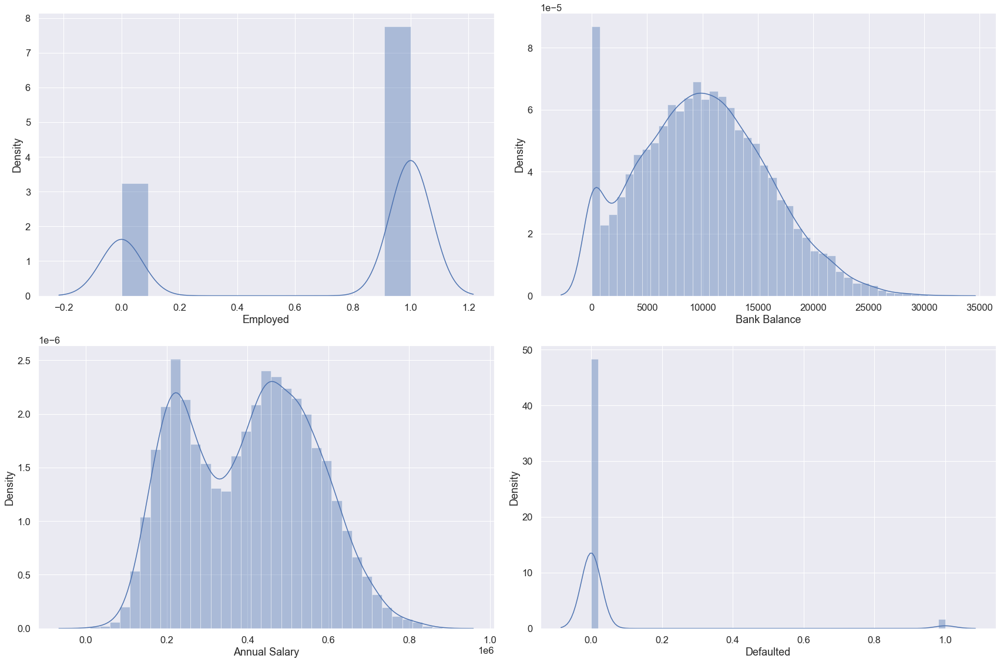

In [67]:
sns.set(font_scale=1.5)
show_dist_plot_x(df.columns,df)

**Observation**

* target 클래스 비율 조정이 필요함.

<Figure size 432x288 with 0 Axes>

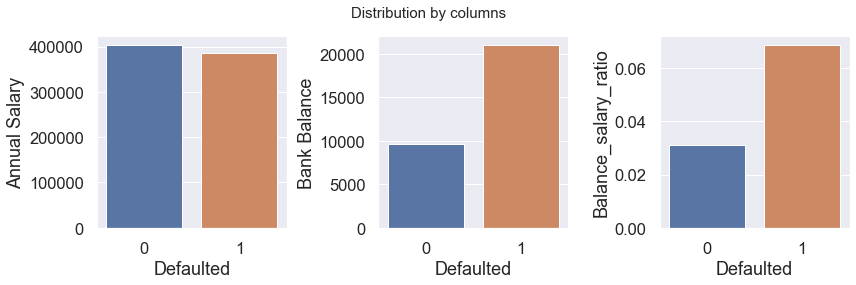

In [209]:
#eda

plt.figure()
f, ax= plt.subplots(1,3,figsize=(12,4))
plt.suptitle("Distribution by columns",fontsize=15)
sns.barplot(x=df['Defaulted'],y=df['Annual Salary'], ci=None,ax=ax[0])
sns.barplot(x=df['Defaulted'],y=df['Bank Balance'], ci=None,ax=ax[1])
sns.barplot(x=df['Defaulted'],y=df['Balance_salary_ratio'], ci=None,ax=ax[2])
plt.tight_layout()

**Observation**

* 파산한 사람도 어느정도 연봉을 보여준다.
* 파산한 사람의 은행 잔고는 그렇지 않은 사람보다 더 많다.

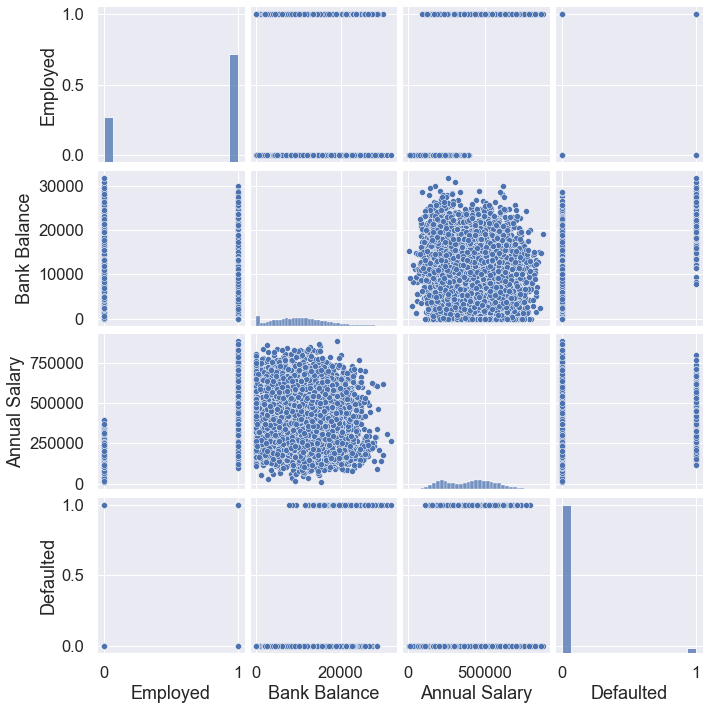

In [239]:
sns.pairplot(df)

In [4]:
#feature engineering
df['Balance_salary_ratio'] = df['Bank Balance']/df['Annual Salary']

<AxesSubplot:>

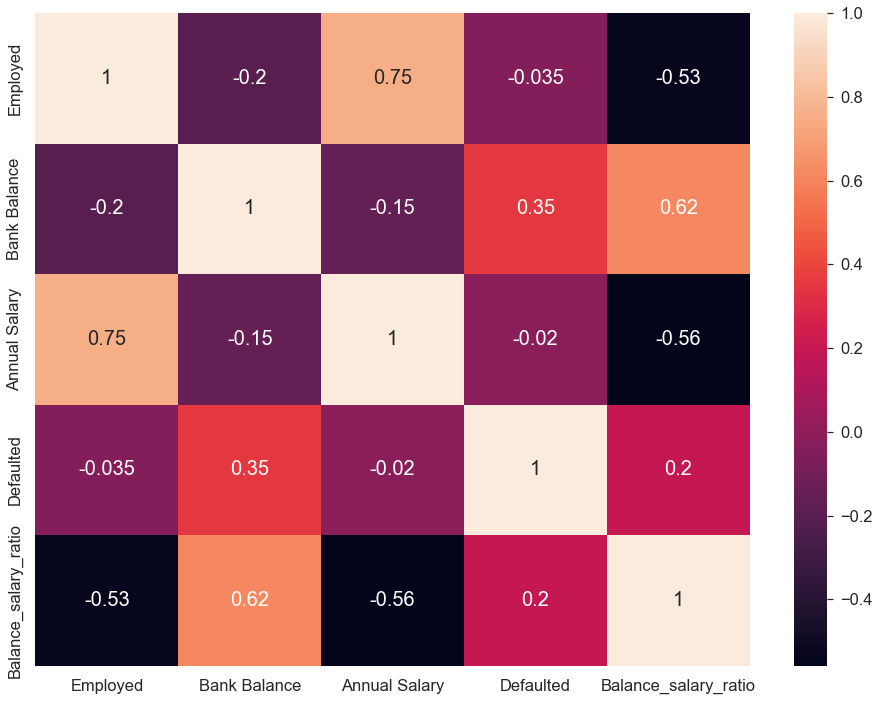

In [247]:
plt.figure(figsize=(16,12))
sns.heatmap(df.corr(),annot=True,annot_kws={'size':20})

In [5]:
X = df.drop(['Defaulted'],1)
y = df.Defaulted
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=.3,random_state=42,stratify=y)

In [6]:
y_train.value_counts(), y_test.value_counts()

(0    6767
 1     233
 Name: Defaulted, dtype: int64,
 0    2900
 1     100
 Name: Defaulted, dtype: int64)

Need to seperate target class equally. if we do not this method, it can't predict '1' class well.

In [7]:
#to seperate equally
sm = SMOTE(
    sampling_strategy='auto',  # samples only the minority class
    random_state=0,  # for reproducibility
    k_neighbors=5,
    n_jobs=4
)

X_res, y_res = sm.fit_resample(X_train, y_train)

In [153]:
X_res.shape, y_res.shape

((13534, 4), (13534,))

In [157]:
y_res.value_counts()

0    6767
1    6767
Name: Defaulted, dtype: int64

In [8]:
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [9]:
clf = RandomForestClassifier(random_state=42)

clf.fit(X_res,y_res)

RandomForestClassifier(random_state=42)

In [10]:
pred = clf.predict(X_test)
pred

array([0, 0, 0, ..., 0, 0, 0])

In [11]:
from sklearn.metrics import classification_report, accuracy_score
accuracy_score(y_test,pred)

0.9103333333333333

In [39]:
accuracy_score = cross_val_score(clf, X_res,y_res,cv=5, scoring='accuracy')
print(f'{accuracy_score}, Mean :  {np.mean(accuracy_score)}')

[0.92242335 0.93165866 0.93461396 0.9268563  0.93348115], Mean :  0.9298066849762094


In [38]:
#pipeline
from sklearn.preprocessing import StandardScaler

pipe = Pipeline([
    ('StandardScaler',StandardScaler()), ##scaler
    ('Random Forest',RandomForestClassifier(random_state=42))
])

pipe.fit(X_res,y_res)

accuracy_score = cross_val_score(pipe, X_res,y_res,cv=5, scoring='accuracy')
print(f'{accuracy_score}, Mean : {np.mean(accuracy_score)}')

[0.92353158 0.93202808 0.93424455 0.92611747 0.93422025], Mean : 0.9300283871630066


>rf 0.933 (0.007)
>lgb 0.935 (0.007)
>cb 0.935 (0.007)


/opt/anaconda3/lib/python3.9/site-packages/xgboost/compat.py:31: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/compat.py:31: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/compat.py:31: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/compat.py:31: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype inste

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

>xgb 0.940 (0.005)


/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

[10:41:32] WARNING: ../src/learner.cc:576: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[10:41:32] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[10:41:37] WARNING: ../src/learner.cc:576: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[10:41:37] WARNING: ../src/learn

[10:41:32] WARNING: ../src/learner.cc:576: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[10:41:32] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[10:41:37] WARNING: ../src/learner.cc:576: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[10:41:37] WARNING: ../src/learn

[10:41:32] WARNING: ../src/learner.cc:576: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[10:41:32] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[10:41:37] WARNING: ../src/learner.cc:576: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[10:41:37] WARNING: ../src/learn

[10:41:32] WARNING: ../src/learner.cc:576: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[10:41:32] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[10:41:37] WARNING: ../src/learner.cc:576: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[10:41:37] WARNING: ../src/learn

[10:41:32] WARNING: ../src/learner.cc:576: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[10:41:32] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[10:41:37] WARNING: ../src/learner.cc:576: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[10:41:37] WARNING: ../src/learn

[10:41:32] WARNING: ../src/learner.cc:576: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[10:41:32] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[10:41:37] WARNING: ../src/learner.cc:576: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[10:41:37] WARNING: ../src/learn

[10:41:32] WARNING: ../src/learner.cc:576: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[10:41:32] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[10:41:37] WARNING: ../src/learner.cc:576: 
Parameters: { "verbose" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[10:41:37] WARNING: ../src/learn

206:	learn: 0.2177162	total: 1.33s	remaining: 5.08s
207:	learn: 0.2176069	total: 1.33s	remaining: 5.09s
208:	learn: 0.2173914	total: 1.34s	remaining: 5.08s
209:	learn: 0.2172718	total: 1.35s	remaining: 5.08s
210:	learn: 0.2171448	total: 1.36s	remaining: 5.08s
211:	learn: 0.2171008	total: 1.37s	remaining: 5.08s
212:	learn: 0.2169707	total: 1.37s	remaining: 5.08s
213:	learn: 0.2167695	total: 1.38s	remaining: 5.08s
214:	learn: 0.2166359	total: 1.39s	remaining: 5.08s
215:	learn: 0.2165508	total: 1.4s	remaining: 5.07s
216:	learn: 0.2163175	total: 1.41s	remaining: 5.07s
217:	learn: 0.2162401	total: 1.41s	remaining: 5.07s
218:	learn: 0.2161869	total: 1.42s	remaining: 5.06s
219:	learn: 0.2161485	total: 1.43s	remaining: 5.06s
220:	learn: 0.2160388	total: 1.44s	remaining: 5.06s
221:	learn: 0.2159847	total: 1.44s	remaining: 5.06s
222:	learn: 0.2157734	total: 1.45s	remaining: 5.05s
223:	learn: 0.2156527	total: 1.46s	remaining: 5.05s
224:	learn: 0.2156152	total: 1.47s	remaining: 5.05s
225:	learn: 0

207:	learn: 0.2132497	total: 1.48s	remaining: 5.63s
208:	learn: 0.2131142	total: 1.49s	remaining: 5.62s
209:	learn: 0.2129962	total: 1.49s	remaining: 5.62s
210:	learn: 0.2128863	total: 1.5s	remaining: 5.62s
211:	learn: 0.2127716	total: 1.51s	remaining: 5.61s
212:	learn: 0.2126759	total: 1.52s	remaining: 5.61s
213:	learn: 0.2124877	total: 1.52s	remaining: 5.6s
214:	learn: 0.2122888	total: 1.53s	remaining: 5.59s
215:	learn: 0.2121772	total: 1.54s	remaining: 5.59s
216:	learn: 0.2120345	total: 1.55s	remaining: 5.59s
217:	learn: 0.2119423	total: 1.56s	remaining: 5.58s
218:	learn: 0.2118021	total: 1.56s	remaining: 5.58s
219:	learn: 0.2116483	total: 1.57s	remaining: 5.57s
220:	learn: 0.2114647	total: 1.58s	remaining: 5.57s
221:	learn: 0.2113828	total: 1.59s	remaining: 5.56s
222:	learn: 0.2113236	total: 1.59s	remaining: 5.56s
223:	learn: 0.2111141	total: 1.6s	remaining: 5.56s
224:	learn: 0.2110303	total: 1.61s	remaining: 5.55s
225:	learn: 0.2109515	total: 1.62s	remaining: 5.55s
226:	learn: 0.2

207:	learn: 0.2101289	total: 1.56s	remaining: 5.95s
208:	learn: 0.2100665	total: 1.57s	remaining: 5.95s
209:	learn: 0.2099932	total: 1.58s	remaining: 5.95s
210:	learn: 0.2099194	total: 1.59s	remaining: 5.94s
211:	learn: 0.2097778	total: 1.6s	remaining: 5.95s
212:	learn: 0.2096613	total: 1.61s	remaining: 5.94s
213:	learn: 0.2095528	total: 1.62s	remaining: 5.94s
214:	learn: 0.2093728	total: 1.63s	remaining: 5.94s
215:	learn: 0.2093313	total: 1.64s	remaining: 5.93s
216:	learn: 0.2091964	total: 1.64s	remaining: 5.93s
217:	learn: 0.2090000	total: 1.65s	remaining: 5.93s
218:	learn: 0.2087687	total: 1.66s	remaining: 5.93s
219:	learn: 0.2085133	total: 1.67s	remaining: 5.92s
220:	learn: 0.2083288	total: 1.68s	remaining: 5.92s
221:	learn: 0.2082214	total: 1.69s	remaining: 5.91s
222:	learn: 0.2081976	total: 1.69s	remaining: 5.9s
223:	learn: 0.2080663	total: 1.7s	remaining: 5.9s
224:	learn: 0.2079294	total: 1.71s	remaining: 5.89s
225:	learn: 0.2078696	total: 1.72s	remaining: 5.89s
226:	learn: 0.20

207:	learn: 0.2135540	total: 1.93s	remaining: 7.35s
208:	learn: 0.2134702	total: 1.93s	remaining: 7.32s
209:	learn: 0.2133121	total: 1.94s	remaining: 7.29s
210:	learn: 0.2131692	total: 1.94s	remaining: 7.26s
211:	learn: 0.2130955	total: 1.95s	remaining: 7.24s
212:	learn: 0.2129289	total: 1.95s	remaining: 7.21s
213:	learn: 0.2128284	total: 1.96s	remaining: 7.19s
214:	learn: 0.2126831	total: 1.96s	remaining: 7.17s
215:	learn: 0.2125466	total: 1.97s	remaining: 7.15s
216:	learn: 0.2124585	total: 1.97s	remaining: 7.12s
217:	learn: 0.2122684	total: 1.98s	remaining: 7.1s
218:	learn: 0.2121827	total: 1.99s	remaining: 7.08s
219:	learn: 0.2120852	total: 1.99s	remaining: 7.06s
220:	learn: 0.2120510	total: 2s	remaining: 7.03s
221:	learn: 0.2117962	total: 2s	remaining: 7.01s
222:	learn: 0.2116880	total: 2s	remaining: 6.99s
223:	learn: 0.2116121	total: 2.01s	remaining: 6.97s
224:	learn: 0.2114953	total: 2.02s	remaining: 6.95s
225:	learn: 0.2114460	total: 2.02s	remaining: 6.93s
226:	learn: 0.2114069	

207:	learn: 0.2143356	total: 1.91s	remaining: 7.27s
208:	learn: 0.2142626	total: 1.93s	remaining: 7.29s
209:	learn: 0.2141469	total: 1.94s	remaining: 7.29s
210:	learn: 0.2140237	total: 1.96s	remaining: 7.32s
211:	learn: 0.2138799	total: 1.97s	remaining: 7.31s
212:	learn: 0.2136718	total: 1.98s	remaining: 7.3s
213:	learn: 0.2134500	total: 1.99s	remaining: 7.29s
214:	learn: 0.2133056	total: 2.01s	remaining: 7.34s
215:	learn: 0.2132427	total: 2.02s	remaining: 7.33s
216:	learn: 0.2131495	total: 2.03s	remaining: 7.32s
217:	learn: 0.2131271	total: 2.04s	remaining: 7.31s
218:	learn: 0.2130295	total: 2.05s	remaining: 7.3s
219:	learn: 0.2128700	total: 2.06s	remaining: 7.29s
220:	learn: 0.2127849	total: 2.06s	remaining: 7.28s
221:	learn: 0.2126619	total: 2.08s	remaining: 7.28s
222:	learn: 0.2125797	total: 2.08s	remaining: 7.27s
223:	learn: 0.2124230	total: 2.1s	remaining: 7.27s
224:	learn: 0.2123662	total: 2.11s	remaining: 7.28s
225:	learn: 0.2122362	total: 2.12s	remaining: 7.27s
226:	learn: 0.2

208:	learn: 0.2133800	total: 1.93s	remaining: 7.32s
209:	learn: 0.2132754	total: 1.94s	remaining: 7.31s
210:	learn: 0.2132418	total: 1.95s	remaining: 7.28s
211:	learn: 0.2131478	total: 1.96s	remaining: 7.29s
212:	learn: 0.2130636	total: 1.97s	remaining: 7.27s
213:	learn: 0.2128918	total: 1.98s	remaining: 7.26s
214:	learn: 0.2127235	total: 1.99s	remaining: 7.25s
215:	learn: 0.2126470	total: 1.99s	remaining: 7.24s
216:	learn: 0.2124496	total: 2s	remaining: 7.22s
217:	learn: 0.2124366	total: 2.01s	remaining: 7.2s
218:	learn: 0.2122780	total: 2.02s	remaining: 7.19s
219:	learn: 0.2121157	total: 2.02s	remaining: 7.17s
220:	learn: 0.2119819	total: 2.03s	remaining: 7.15s
221:	learn: 0.2118877	total: 2.04s	remaining: 7.14s
222:	learn: 0.2117981	total: 2.04s	remaining: 7.12s
223:	learn: 0.2116662	total: 2.05s	remaining: 7.11s
224:	learn: 0.2115601	total: 2.06s	remaining: 7.1s
225:	learn: 0.2114786	total: 2.07s	remaining: 7.08s
226:	learn: 0.2113544	total: 2.08s	remaining: 7.07s
227:	learn: 0.211

218:	learn: 0.2109513	total: 2s	remaining: 7.12s
219:	learn: 0.2107633	total: 2s	remaining: 7.11s
220:	learn: 0.2106282	total: 2.02s	remaining: 7.1s
221:	learn: 0.2105108	total: 2.02s	remaining: 7.09s
222:	learn: 0.2103717	total: 2.03s	remaining: 7.09s
223:	learn: 0.2102464	total: 2.04s	remaining: 7.08s
224:	learn: 0.2101270	total: 2.05s	remaining: 7.07s
225:	learn: 0.2099951	total: 2.06s	remaining: 7.05s
226:	learn: 0.2098977	total: 2.07s	remaining: 7.04s
227:	learn: 0.2097402	total: 2.08s	remaining: 7.03s
228:	learn: 0.2096631	total: 2.08s	remaining: 7.02s
229:	learn: 0.2094661	total: 2.09s	remaining: 7.01s
230:	learn: 0.2093285	total: 2.1s	remaining: 7s
231:	learn: 0.2091483	total: 2.11s	remaining: 6.99s
232:	learn: 0.2090667	total: 2.12s	remaining: 6.98s
233:	learn: 0.2089418	total: 2.13s	remaining: 6.97s
234:	learn: 0.2087133	total: 2.13s	remaining: 6.95s
235:	learn: 0.2085516	total: 2.14s	remaining: 6.94s
236:	learn: 0.2082394	total: 2.15s	remaining: 6.93s
237:	learn: 0.2081095	t

219:	learn: 0.2120395	total: 2.35s	remaining: 8.33s
220:	learn: 0.2119049	total: 2.36s	remaining: 8.31s
221:	learn: 0.2117409	total: 2.37s	remaining: 8.29s
222:	learn: 0.2116323	total: 2.37s	remaining: 8.27s
223:	learn: 0.2115523	total: 2.38s	remaining: 8.25s
224:	learn: 0.2113905	total: 2.39s	remaining: 8.24s
225:	learn: 0.2112112	total: 2.4s	remaining: 8.22s
226:	learn: 0.2110588	total: 2.41s	remaining: 8.21s
227:	learn: 0.2109622	total: 2.42s	remaining: 8.19s
228:	learn: 0.2107425	total: 2.43s	remaining: 8.18s
229:	learn: 0.2105852	total: 2.44s	remaining: 8.17s
230:	learn: 0.2104688	total: 2.45s	remaining: 8.15s
231:	learn: 0.2103922	total: 2.46s	remaining: 8.14s
232:	learn: 0.2102729	total: 2.47s	remaining: 8.12s
233:	learn: 0.2101397	total: 2.48s	remaining: 8.11s
234:	learn: 0.2100841	total: 2.49s	remaining: 8.09s
235:	learn: 0.2099794	total: 2.5s	remaining: 8.09s
236:	learn: 0.2099068	total: 2.51s	remaining: 8.08s
237:	learn: 0.2097574	total: 2.53s	remaining: 8.09s
238:	learn: 0.

471:	learn: 0.1859342	total: 4.01s	remaining: 4.48s
472:	learn: 0.1857737	total: 4.01s	remaining: 4.47s
473:	learn: 0.1856848	total: 4.02s	remaining: 4.46s
474:	learn: 0.1856755	total: 4.03s	remaining: 4.46s
475:	learn: 0.1855549	total: 4.04s	remaining: 4.45s
476:	learn: 0.1854086	total: 4.05s	remaining: 4.44s
477:	learn: 0.1853618	total: 4.06s	remaining: 4.43s
478:	learn: 0.1852554	total: 4.07s	remaining: 4.42s
479:	learn: 0.1851276	total: 4.07s	remaining: 4.41s
480:	learn: 0.1850733	total: 4.08s	remaining: 4.41s
481:	learn: 0.1849131	total: 4.09s	remaining: 4.4s
482:	learn: 0.1847258	total: 4.1s	remaining: 4.39s
483:	learn: 0.1847167	total: 4.11s	remaining: 4.38s
484:	learn: 0.1845836	total: 4.12s	remaining: 4.37s
485:	learn: 0.1845406	total: 4.13s	remaining: 4.37s
486:	learn: 0.1844219	total: 4.14s	remaining: 4.36s
487:	learn: 0.1843065	total: 4.15s	remaining: 4.35s
488:	learn: 0.1842632	total: 4.16s	remaining: 4.34s
489:	learn: 0.1841505	total: 4.16s	remaining: 4.33s
490:	learn: 0.

471:	learn: 0.1854832	total: 4s	remaining: 4.47s
472:	learn: 0.1853949	total: 4.01s	remaining: 4.46s
473:	learn: 0.1853134	total: 4.01s	remaining: 4.45s
474:	learn: 0.1852215	total: 4.02s	remaining: 4.45s
475:	learn: 0.1849935	total: 4.03s	remaining: 4.44s
476:	learn: 0.1848284	total: 4.04s	remaining: 4.43s
477:	learn: 0.1847935	total: 4.05s	remaining: 4.42s
478:	learn: 0.1847530	total: 4.06s	remaining: 4.41s
479:	learn: 0.1846698	total: 4.07s	remaining: 4.41s
480:	learn: 0.1844964	total: 4.07s	remaining: 4.39s
481:	learn: 0.1844447	total: 4.08s	remaining: 4.39s
482:	learn: 0.1844151	total: 4.09s	remaining: 4.38s
483:	learn: 0.1843543	total: 4.1s	remaining: 4.37s
484:	learn: 0.1843205	total: 4.11s	remaining: 4.36s
485:	learn: 0.1842879	total: 4.12s	remaining: 4.36s
486:	learn: 0.1841245	total: 4.13s	remaining: 4.35s
487:	learn: 0.1839732	total: 4.13s	remaining: 4.34s
488:	learn: 0.1839034	total: 4.14s	remaining: 4.33s
489:	learn: 0.1837832	total: 4.15s	remaining: 4.32s
490:	learn: 0.18

470:	learn: 0.1879214	total: 4.06s	remaining: 4.56s
471:	learn: 0.1877826	total: 4.07s	remaining: 4.55s
472:	learn: 0.1876561	total: 4.08s	remaining: 4.54s
473:	learn: 0.1875057	total: 4.09s	remaining: 4.53s
474:	learn: 0.1873916	total: 4.09s	remaining: 4.53s
475:	learn: 0.1870924	total: 4.1s	remaining: 4.52s
476:	learn: 0.1869785	total: 4.11s	remaining: 4.51s
477:	learn: 0.1869146	total: 4.12s	remaining: 4.5s
478:	learn: 0.1868273	total: 4.13s	remaining: 4.49s
479:	learn: 0.1867437	total: 4.14s	remaining: 4.48s
480:	learn: 0.1866359	total: 4.14s	remaining: 4.47s
481:	learn: 0.1865348	total: 4.15s	remaining: 4.46s
482:	learn: 0.1863717	total: 4.16s	remaining: 4.46s
483:	learn: 0.1863215	total: 4.17s	remaining: 4.45s
484:	learn: 0.1862704	total: 4.18s	remaining: 4.44s
485:	learn: 0.1861260	total: 4.19s	remaining: 4.43s
486:	learn: 0.1860198	total: 4.2s	remaining: 4.42s
487:	learn: 0.1859000	total: 4.2s	remaining: 4.41s
488:	learn: 0.1858350	total: 4.21s	remaining: 4.4s
489:	learn: 0.185

471:	learn: 0.1884219	total: 3.98s	remaining: 4.45s
472:	learn: 0.1882933	total: 3.99s	remaining: 4.45s
473:	learn: 0.1881440	total: 4s	remaining: 4.45s
474:	learn: 0.1879945	total: 4.02s	remaining: 4.44s
475:	learn: 0.1879747	total: 4.03s	remaining: 4.44s
476:	learn: 0.1878422	total: 4.04s	remaining: 4.43s
477:	learn: 0.1877886	total: 4.05s	remaining: 4.42s
478:	learn: 0.1877230	total: 4.06s	remaining: 4.41s
479:	learn: 0.1876259	total: 4.07s	remaining: 4.4s
480:	learn: 0.1874874	total: 4.07s	remaining: 4.4s
481:	learn: 0.1872855	total: 4.08s	remaining: 4.39s
482:	learn: 0.1871707	total: 4.09s	remaining: 4.38s
483:	learn: 0.1871184	total: 4.1s	remaining: 4.37s
484:	learn: 0.1870822	total: 4.11s	remaining: 4.36s
485:	learn: 0.1869531	total: 4.12s	remaining: 4.35s
486:	learn: 0.1867796	total: 4.12s	remaining: 4.34s
487:	learn: 0.1867390	total: 4.13s	remaining: 4.33s
488:	learn: 0.1867030	total: 4.14s	remaining: 4.32s
489:	learn: 0.1865708	total: 4.15s	remaining: 4.32s
490:	learn: 0.1864

471:	learn: 0.1862412	total: 3.97s	remaining: 4.44s
472:	learn: 0.1861752	total: 3.98s	remaining: 4.43s
473:	learn: 0.1860321	total: 3.98s	remaining: 4.42s
474:	learn: 0.1859442	total: 3.99s	remaining: 4.41s
475:	learn: 0.1858031	total: 4s	remaining: 4.41s
476:	learn: 0.1855454	total: 4.01s	remaining: 4.4s
477:	learn: 0.1853675	total: 4.02s	remaining: 4.39s
478:	learn: 0.1852830	total: 4.03s	remaining: 4.38s
479:	learn: 0.1850659	total: 4.04s	remaining: 4.38s
480:	learn: 0.1849358	total: 4.05s	remaining: 4.37s
481:	learn: 0.1848085	total: 4.06s	remaining: 4.36s
482:	learn: 0.1847433	total: 4.07s	remaining: 4.35s
483:	learn: 0.1846052	total: 4.08s	remaining: 4.34s
484:	learn: 0.1844601	total: 4.08s	remaining: 4.33s
485:	learn: 0.1843415	total: 4.09s	remaining: 4.33s
486:	learn: 0.1842091	total: 4.1s	remaining: 4.32s
487:	learn: 0.1840722	total: 4.11s	remaining: 4.31s
488:	learn: 0.1839966	total: 4.12s	remaining: 4.31s
489:	learn: 0.1838861	total: 4.13s	remaining: 4.3s
490:	learn: 0.1838

472:	learn: 0.1897646	total: 4.05s	remaining: 4.51s
473:	learn: 0.1896948	total: 4.06s	remaining: 4.5s
474:	learn: 0.1895814	total: 4.07s	remaining: 4.49s
475:	learn: 0.1894725	total: 4.08s	remaining: 4.49s
476:	learn: 0.1893227	total: 4.08s	remaining: 4.48s
477:	learn: 0.1892704	total: 4.09s	remaining: 4.47s
478:	learn: 0.1891834	total: 4.11s	remaining: 4.47s
479:	learn: 0.1890765	total: 4.11s	remaining: 4.46s
480:	learn: 0.1889804	total: 4.12s	remaining: 4.45s
481:	learn: 0.1889499	total: 4.13s	remaining: 4.44s
482:	learn: 0.1888610	total: 4.14s	remaining: 4.43s
483:	learn: 0.1887693	total: 4.15s	remaining: 4.43s
484:	learn: 0.1887057	total: 4.17s	remaining: 4.42s
485:	learn: 0.1885791	total: 4.17s	remaining: 4.41s
486:	learn: 0.1883568	total: 4.18s	remaining: 4.41s
487:	learn: 0.1882972	total: 4.2s	remaining: 4.4s
488:	learn: 0.1881363	total: 4.2s	remaining: 4.39s
489:	learn: 0.1880224	total: 4.21s	remaining: 4.38s
490:	learn: 0.1879189	total: 4.22s	remaining: 4.37s
491:	learn: 0.18

482:	learn: 0.1823017	total: 4.26s	remaining: 4.56s
483:	learn: 0.1821394	total: 4.27s	remaining: 4.55s
484:	learn: 0.1821285	total: 4.28s	remaining: 4.55s
485:	learn: 0.1820504	total: 4.29s	remaining: 4.54s
486:	learn: 0.1819610	total: 4.3s	remaining: 4.53s
487:	learn: 0.1819241	total: 4.31s	remaining: 4.52s
488:	learn: 0.1817605	total: 4.32s	remaining: 4.51s
489:	learn: 0.1816118	total: 4.33s	remaining: 4.5s
490:	learn: 0.1814534	total: 4.34s	remaining: 4.5s
491:	learn: 0.1812935	total: 4.35s	remaining: 4.49s
492:	learn: 0.1812472	total: 4.36s	remaining: 4.49s
493:	learn: 0.1810906	total: 4.38s	remaining: 4.48s
494:	learn: 0.1809632	total: 4.38s	remaining: 4.47s
495:	learn: 0.1808912	total: 4.39s	remaining: 4.46s
496:	learn: 0.1808406	total: 4.41s	remaining: 4.46s
497:	learn: 0.1806736	total: 4.41s	remaining: 4.45s
498:	learn: 0.1806257	total: 4.42s	remaining: 4.44s
499:	learn: 0.1805943	total: 4.43s	remaining: 4.43s
500:	learn: 0.1805819	total: 4.44s	remaining: 4.42s
501:	learn: 0.1

483:	learn: 0.1840500	total: 4.37s	remaining: 4.66s
484:	learn: 0.1839904	total: 4.38s	remaining: 4.65s
485:	learn: 0.1839141	total: 4.4s	remaining: 4.65s
486:	learn: 0.1837530	total: 4.41s	remaining: 4.65s
487:	learn: 0.1836525	total: 4.42s	remaining: 4.64s
488:	learn: 0.1835353	total: 4.43s	remaining: 4.63s
489:	learn: 0.1833651	total: 4.45s	remaining: 4.63s
490:	learn: 0.1832283	total: 4.46s	remaining: 4.62s
491:	learn: 0.1830739	total: 4.47s	remaining: 4.61s
492:	learn: 0.1829696	total: 4.48s	remaining: 4.61s
493:	learn: 0.1828198	total: 4.49s	remaining: 4.6s
494:	learn: 0.1827264	total: 4.5s	remaining: 4.59s
495:	learn: 0.1826720	total: 4.51s	remaining: 4.58s
496:	learn: 0.1826617	total: 4.52s	remaining: 4.58s
497:	learn: 0.1826032	total: 4.53s	remaining: 4.57s
498:	learn: 0.1824431	total: 4.54s	remaining: 4.56s
499:	learn: 0.1823524	total: 4.55s	remaining: 4.55s
500:	learn: 0.1823071	total: 4.56s	remaining: 4.54s
501:	learn: 0.1822351	total: 4.57s	remaining: 4.54s
502:	learn: 0.1

736:	learn: 0.1620027	total: 6.88s	remaining: 2.46s
737:	learn: 0.1619182	total: 6.89s	remaining: 2.45s
738:	learn: 0.1618837	total: 6.9s	remaining: 2.44s
739:	learn: 0.1618219	total: 6.91s	remaining: 2.43s
740:	learn: 0.1617810	total: 6.92s	remaining: 2.42s
741:	learn: 0.1617431	total: 6.93s	remaining: 2.41s
742:	learn: 0.1616352	total: 6.94s	remaining: 2.4s
743:	learn: 0.1615598	total: 6.95s	remaining: 2.39s
744:	learn: 0.1614885	total: 6.96s	remaining: 2.38s
745:	learn: 0.1614259	total: 6.97s	remaining: 2.37s
746:	learn: 0.1613426	total: 6.98s	remaining: 2.36s
747:	learn: 0.1612618	total: 6.99s	remaining: 2.35s
748:	learn: 0.1611655	total: 7s	remaining: 2.34s
749:	learn: 0.1610441	total: 7s	remaining: 2.33s
750:	learn: 0.1609777	total: 7.01s	remaining: 2.32s
751:	learn: 0.1608777	total: 7.02s	remaining: 2.31s
752:	learn: 0.1607853	total: 7.03s	remaining: 2.31s
753:	learn: 0.1607005	total: 7.04s	remaining: 2.3s
754:	learn: 0.1606103	total: 7.05s	remaining: 2.29s
755:	learn: 0.1605470

736:	learn: 0.1616547	total: 6.92s	remaining: 2.47s
737:	learn: 0.1615483	total: 6.93s	remaining: 2.46s
738:	learn: 0.1614431	total: 6.94s	remaining: 2.45s
739:	learn: 0.1613741	total: 6.95s	remaining: 2.44s
740:	learn: 0.1612723	total: 6.96s	remaining: 2.43s
741:	learn: 0.1612478	total: 6.97s	remaining: 2.42s
742:	learn: 0.1611746	total: 6.98s	remaining: 2.41s
743:	learn: 0.1611213	total: 6.99s	remaining: 2.4s
744:	learn: 0.1610492	total: 6.99s	remaining: 2.39s
745:	learn: 0.1610413	total: 7s	remaining: 2.38s
746:	learn: 0.1609719	total: 7.01s	remaining: 2.37s
747:	learn: 0.1609525	total: 7.02s	remaining: 2.36s
748:	learn: 0.1608879	total: 7.03s	remaining: 2.35s
749:	learn: 0.1608661	total: 7.04s	remaining: 2.35s
750:	learn: 0.1608197	total: 7.04s	remaining: 2.33s
751:	learn: 0.1607941	total: 7.05s	remaining: 2.33s
752:	learn: 0.1607245	total: 7.06s	remaining: 2.31s
753:	learn: 0.1606973	total: 7.07s	remaining: 2.31s
754:	learn: 0.1606799	total: 7.08s	remaining: 2.3s
755:	learn: 0.160

736:	learn: 0.1600704	total: 6.81s	remaining: 2.43s
737:	learn: 0.1600229	total: 6.82s	remaining: 2.42s
738:	learn: 0.1599443	total: 6.83s	remaining: 2.41s
739:	learn: 0.1599227	total: 6.83s	remaining: 2.4s
740:	learn: 0.1598960	total: 6.84s	remaining: 2.39s
741:	learn: 0.1598103	total: 6.86s	remaining: 2.38s
742:	learn: 0.1597501	total: 6.87s	remaining: 2.37s
743:	learn: 0.1597013	total: 6.87s	remaining: 2.37s
744:	learn: 0.1596220	total: 6.88s	remaining: 2.35s
745:	learn: 0.1596098	total: 6.89s	remaining: 2.35s
746:	learn: 0.1594996	total: 6.9s	remaining: 2.34s
747:	learn: 0.1593865	total: 6.91s	remaining: 2.33s
748:	learn: 0.1593154	total: 6.91s	remaining: 2.32s
749:	learn: 0.1592204	total: 6.92s	remaining: 2.31s
750:	learn: 0.1591864	total: 6.93s	remaining: 2.3s
751:	learn: 0.1591175	total: 6.94s	remaining: 2.29s
752:	learn: 0.1590090	total: 6.95s	remaining: 2.28s
753:	learn: 0.1589344	total: 6.96s	remaining: 2.27s
754:	learn: 0.1589090	total: 6.96s	remaining: 2.26s
755:	learn: 0.1

736:	learn: 0.1639189	total: 6.75s	remaining: 2.41s
737:	learn: 0.1638132	total: 6.75s	remaining: 2.4s
738:	learn: 0.1637734	total: 6.76s	remaining: 2.39s
739:	learn: 0.1637290	total: 6.78s	remaining: 2.38s
740:	learn: 0.1636939	total: 6.79s	remaining: 2.37s
741:	learn: 0.1636358	total: 6.79s	remaining: 2.36s
742:	learn: 0.1635252	total: 6.81s	remaining: 2.35s
743:	learn: 0.1634774	total: 6.82s	remaining: 2.35s
744:	learn: 0.1633744	total: 6.83s	remaining: 2.34s
745:	learn: 0.1632878	total: 6.84s	remaining: 2.33s
746:	learn: 0.1632142	total: 6.84s	remaining: 2.32s
747:	learn: 0.1631811	total: 6.86s	remaining: 2.31s
748:	learn: 0.1631032	total: 6.87s	remaining: 2.3s
749:	learn: 0.1630557	total: 6.88s	remaining: 2.29s
750:	learn: 0.1629223	total: 6.88s	remaining: 2.28s
751:	learn: 0.1628883	total: 6.89s	remaining: 2.27s
752:	learn: 0.1627618	total: 6.9s	remaining: 2.26s
753:	learn: 0.1627366	total: 6.91s	remaining: 2.25s
754:	learn: 0.1626989	total: 6.92s	remaining: 2.25s
755:	learn: 0.1

737:	learn: 0.1635056	total: 6.8s	remaining: 2.41s
738:	learn: 0.1634804	total: 6.81s	remaining: 2.4s
739:	learn: 0.1634594	total: 6.82s	remaining: 2.4s
740:	learn: 0.1634003	total: 6.83s	remaining: 2.38s
741:	learn: 0.1632829	total: 6.84s	remaining: 2.38s
742:	learn: 0.1632400	total: 6.85s	remaining: 2.37s
743:	learn: 0.1631984	total: 6.86s	remaining: 2.36s
744:	learn: 0.1631925	total: 6.87s	remaining: 2.35s
745:	learn: 0.1631204	total: 6.88s	remaining: 2.34s
746:	learn: 0.1630986	total: 6.89s	remaining: 2.33s
747:	learn: 0.1630793	total: 6.9s	remaining: 2.32s
748:	learn: 0.1629751	total: 6.91s	remaining: 2.31s
749:	learn: 0.1628729	total: 6.93s	remaining: 2.31s
750:	learn: 0.1628447	total: 6.94s	remaining: 2.3s
751:	learn: 0.1627446	total: 6.95s	remaining: 2.29s
752:	learn: 0.1627148	total: 6.96s	remaining: 2.28s
753:	learn: 0.1626572	total: 6.97s	remaining: 2.27s
754:	learn: 0.1626172	total: 6.99s	remaining: 2.27s
755:	learn: 0.1625076	total: 6.99s	remaining: 2.26s
756:	learn: 0.162

735:	learn: 0.1636796	total: 7.69s	remaining: 2.76s
736:	learn: 0.1636209	total: 7.71s	remaining: 2.75s
737:	learn: 0.1635216	total: 7.72s	remaining: 2.74s
738:	learn: 0.1633777	total: 7.73s	remaining: 2.73s
739:	learn: 0.1632589	total: 7.74s	remaining: 2.72s
740:	learn: 0.1631918	total: 7.75s	remaining: 2.71s
741:	learn: 0.1631665	total: 7.77s	remaining: 2.7s
742:	learn: 0.1630542	total: 7.78s	remaining: 2.69s
743:	learn: 0.1629896	total: 7.79s	remaining: 2.68s
744:	learn: 0.1629658	total: 7.81s	remaining: 2.67s
745:	learn: 0.1629037	total: 7.82s	remaining: 2.66s
746:	learn: 0.1628518	total: 7.83s	remaining: 2.65s
747:	learn: 0.1627628	total: 7.84s	remaining: 2.64s
748:	learn: 0.1627223	total: 7.86s	remaining: 2.63s
749:	learn: 0.1626984	total: 7.86s	remaining: 2.62s
750:	learn: 0.1626198	total: 7.87s	remaining: 2.61s
751:	learn: 0.1625902	total: 7.88s	remaining: 2.6s
752:	learn: 0.1625297	total: 7.89s	remaining: 2.59s
753:	learn: 0.1624882	total: 7.9s	remaining: 2.58s
754:	learn: 0.1

747:	learn: 0.1592848	total: 7.73s	remaining: 2.6s
748:	learn: 0.1592136	total: 7.74s	remaining: 2.59s
749:	learn: 0.1591459	total: 7.75s	remaining: 2.58s
750:	learn: 0.1590988	total: 7.76s	remaining: 2.57s
751:	learn: 0.1590301	total: 7.77s	remaining: 2.56s
752:	learn: 0.1589468	total: 7.79s	remaining: 2.56s
753:	learn: 0.1589020	total: 7.8s	remaining: 2.55s
754:	learn: 0.1588515	total: 7.82s	remaining: 2.54s
755:	learn: 0.1588088	total: 7.84s	remaining: 2.53s
756:	learn: 0.1587459	total: 7.85s	remaining: 2.52s
757:	learn: 0.1586542	total: 7.87s	remaining: 2.51s
758:	learn: 0.1585431	total: 7.88s	remaining: 2.5s
759:	learn: 0.1584637	total: 7.89s	remaining: 2.49s
760:	learn: 0.1584357	total: 7.9s	remaining: 2.48s
761:	learn: 0.1583111	total: 7.91s	remaining: 2.47s
762:	learn: 0.1582521	total: 7.93s	remaining: 2.46s
763:	learn: 0.1581905	total: 7.94s	remaining: 2.45s
764:	learn: 0.1581252	total: 7.95s	remaining: 2.44s
765:	learn: 0.1580866	total: 7.96s	remaining: 2.43s
766:	learn: 0.15

748:	learn: 0.1615406	total: 7.65s	remaining: 2.56s
749:	learn: 0.1614454	total: 7.66s	remaining: 2.55s
750:	learn: 0.1613342	total: 7.67s	remaining: 2.54s
751:	learn: 0.1612809	total: 7.68s	remaining: 2.53s
752:	learn: 0.1612170	total: 7.68s	remaining: 2.52s
753:	learn: 0.1611931	total: 7.7s	remaining: 2.51s
754:	learn: 0.1611032	total: 7.7s	remaining: 2.5s
755:	learn: 0.1610867	total: 7.71s	remaining: 2.49s
756:	learn: 0.1609869	total: 7.72s	remaining: 2.48s
757:	learn: 0.1609036	total: 7.73s	remaining: 2.47s
758:	learn: 0.1607804	total: 7.74s	remaining: 2.46s
759:	learn: 0.1607298	total: 7.75s	remaining: 2.45s
760:	learn: 0.1606905	total: 7.76s	remaining: 2.44s
761:	learn: 0.1606240	total: 7.76s	remaining: 2.42s
762:	learn: 0.1605340	total: 7.77s	remaining: 2.41s
763:	learn: 0.1605061	total: 7.79s	remaining: 2.4s
764:	learn: 0.1604021	total: 7.8s	remaining: 2.4s
765:	learn: 0.1603428	total: 7.82s	remaining: 2.39s
766:	learn: 0.1602782	total: 7.83s	remaining: 2.38s
767:	learn: 0.1602

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

999:	learn: 0.1481145	total: 9.16s	remaining: 0us
Learning rate set to 0.027235
0:	learn: 0.6658285	total: 10.4ms	remaining: 10.4s
1:	learn: 0.6378341	total: 19.2ms	remaining: 9.6s
2:	learn: 0.6097445	total: 27.9ms	remaining: 9.28s
3:	learn: 0.5810126	total: 36.2ms	remaining: 9s
4:	learn: 0.5537159	total: 44.8ms	remaining: 8.92s
5:	learn: 0.5329457	total: 53.5ms	remaining: 8.87s
6:	learn: 0.5160687	total: 60.4ms	remaining: 8.56s
7:	learn: 0.4982495	total: 68ms	remaining: 8.43s
8:	learn: 0.4792092	total: 75.1ms	remaining: 8.27s
9:	learn: 0.4629612	total: 85.5ms	remaining: 8.46s
10:	learn: 0.4477994	total: 93.5ms	remaining: 8.41s
11:	learn: 0.4334530	total: 101ms	remaining: 8.29s
12:	learn: 0.4225779	total: 107ms	remaining: 8.15s
13:	learn: 0.4131651	total: 116ms	remaining: 8.17s
14:	learn: 0.4024222	total: 124ms	remaining: 8.12s
15:	learn: 0.3898049	total: 131ms	remaining: 8.09s
16:	learn: 0.3793148	total: 140ms	remaining: 8.07s
17:	learn: 0.3702722	total: 148ms	remaining: 8.07s
18:	lea

999:	learn: 0.1456095	total: 9.34s	remaining: 0us
Learning rate set to 0.027236
0:	learn: 0.6656067	total: 10.1ms	remaining: 10.1s
1:	learn: 0.6351834	total: 21.9ms	remaining: 10.9s
2:	learn: 0.6030755	total: 30.4ms	remaining: 10.1s
3:	learn: 0.5798515	total: 39.8ms	remaining: 9.9s
4:	learn: 0.5544737	total: 50.3ms	remaining: 10s
5:	learn: 0.5276663	total: 59.6ms	remaining: 9.88s
6:	learn: 0.5068813	total: 68.7ms	remaining: 9.75s
7:	learn: 0.4931430	total: 75ms	remaining: 9.3s
8:	learn: 0.4728849	total: 82.9ms	remaining: 9.13s
9:	learn: 0.4576171	total: 91.7ms	remaining: 9.08s
10:	learn: 0.4399951	total: 102ms	remaining: 9.19s
11:	learn: 0.4266498	total: 112ms	remaining: 9.22s
12:	learn: 0.4133483	total: 124ms	remaining: 9.38s
13:	learn: 0.4035553	total: 132ms	remaining: 9.31s
14:	learn: 0.3928957	total: 142ms	remaining: 9.32s
15:	learn: 0.3847381	total: 150ms	remaining: 9.21s
16:	learn: 0.3747097	total: 158ms	remaining: 9.15s
17:	learn: 0.3665594	total: 166ms	remaining: 9.06s
18:	lear

999:	learn: 0.1484159	total: 9.2s	remaining: 0us
Learning rate set to 0.027236
0:	learn: 0.6622699	total: 7.58ms	remaining: 7.58s
1:	learn: 0.6342060	total: 17.2ms	remaining: 8.58s
2:	learn: 0.6026408	total: 25.7ms	remaining: 8.53s
3:	learn: 0.5789874	total: 33.2ms	remaining: 8.27s
4:	learn: 0.5518671	total: 41.6ms	remaining: 8.27s
5:	learn: 0.5265368	total: 51.6ms	remaining: 8.54s
6:	learn: 0.5060204	total: 61.1ms	remaining: 8.67s
7:	learn: 0.4891085	total: 72.7ms	remaining: 9.01s
8:	learn: 0.4726427	total: 83ms	remaining: 9.14s
9:	learn: 0.4555369	total: 91.9ms	remaining: 9.09s
10:	learn: 0.4399178	total: 105ms	remaining: 9.43s
11:	learn: 0.4274112	total: 116ms	remaining: 9.54s
12:	learn: 0.4155003	total: 125ms	remaining: 9.5s
13:	learn: 0.4059928	total: 135ms	remaining: 9.49s
14:	learn: 0.3938639	total: 143ms	remaining: 9.41s
15:	learn: 0.3874907	total: 154ms	remaining: 9.45s
16:	learn: 0.3775761	total: 161ms	remaining: 9.3s
17:	learn: 0.3675754	total: 168ms	remaining: 9.19s
18:	lea

1:	learn: 0.6347157	total: 17.8ms	remaining: 8.9s
2:	learn: 0.6069813	total: 25.4ms	remaining: 8.44s
3:	learn: 0.5828949	total: 34.5ms	remaining: 8.59s
4:	learn: 0.5592055	total: 43.5ms	remaining: 8.66s
5:	learn: 0.5386452	total: 52.7ms	remaining: 8.72s
6:	learn: 0.5170101	total: 60.8ms	remaining: 8.63s
7:	learn: 0.4990574	total: 70.6ms	remaining: 8.76s
8:	learn: 0.4785209	total: 80ms	remaining: 8.81s
9:	learn: 0.4615677	total: 88.8ms	remaining: 8.79s
10:	learn: 0.4477580	total: 98ms	remaining: 8.81s
11:	learn: 0.4335683	total: 105ms	remaining: 8.68s
12:	learn: 0.4217884	total: 112ms	remaining: 8.52s
13:	learn: 0.4116032	total: 121ms	remaining: 8.54s
14:	learn: 0.4009895	total: 129ms	remaining: 8.47s
15:	learn: 0.3886539	total: 137ms	remaining: 8.43s
16:	learn: 0.3790086	total: 146ms	remaining: 8.45s
17:	learn: 0.3697741	total: 155ms	remaining: 8.44s
18:	learn: 0.3603583	total: 165ms	remaining: 8.49s
19:	learn: 0.3520430	total: 174ms	remaining: 8.51s
20:	learn: 0.3451651	total: 186ms	r

0:	learn: 0.6623174	total: 9.04ms	remaining: 9.03s
1:	learn: 0.6342583	total: 20.3ms	remaining: 10.1s
2:	learn: 0.6016505	total: 31.4ms	remaining: 10.4s
3:	learn: 0.5782988	total: 44.6ms	remaining: 11.1s
4:	learn: 0.5533255	total: 53.4ms	remaining: 10.6s
5:	learn: 0.5277063	total: 62.7ms	remaining: 10.4s
6:	learn: 0.5071503	total: 73.2ms	remaining: 10.4s
7:	learn: 0.4902728	total: 81.9ms	remaining: 10.2s
8:	learn: 0.4737181	total: 90.3ms	remaining: 9.95s
9:	learn: 0.4566985	total: 98.2ms	remaining: 9.72s
10:	learn: 0.4407201	total: 107ms	remaining: 9.66s
11:	learn: 0.4285649	total: 119ms	remaining: 9.81s
12:	learn: 0.4164842	total: 128ms	remaining: 9.73s
13:	learn: 0.4069016	total: 137ms	remaining: 9.62s
14:	learn: 0.3952822	total: 146ms	remaining: 9.58s
15:	learn: 0.3845027	total: 156ms	remaining: 9.58s
16:	learn: 0.3739465	total: 167ms	remaining: 9.63s
17:	learn: 0.3653232	total: 176ms	remaining: 9.61s
18:	learn: 0.3588683	total: 186ms	remaining: 9.62s
19:	learn: 0.3506893	total: 196

998:	learn: 0.1472666	total: 10.6s	remaining: 10.6ms
999:	learn: 0.1472081	total: 10.6s	remaining: 0us
Learning rate set to 0.027235
0:	learn: 0.6654222	total: 12.2ms	remaining: 12.2s
1:	learn: 0.6373058	total: 23ms	remaining: 11.5s
2:	learn: 0.6078924	total: 33ms	remaining: 11s
3:	learn: 0.5837644	total: 45.4ms	remaining: 11.3s
4:	learn: 0.5593590	total: 57.4ms	remaining: 11.4s
5:	learn: 0.5392289	total: 67.5ms	remaining: 11.2s
6:	learn: 0.5174764	total: 79.9ms	remaining: 11.3s
7:	learn: 0.4994882	total: 91.8ms	remaining: 11.4s
8:	learn: 0.4799974	total: 101ms	remaining: 11.2s
9:	learn: 0.4629153	total: 112ms	remaining: 11.1s
10:	learn: 0.4525613	total: 118ms	remaining: 10.6s
11:	learn: 0.4383202	total: 131ms	remaining: 10.8s
12:	learn: 0.4243802	total: 142ms	remaining: 10.8s
13:	learn: 0.4142650	total: 151ms	remaining: 10.6s
14:	learn: 0.4013979	total: 164ms	remaining: 10.8s
15:	learn: 0.3926673	total: 182ms	remaining: 11.2s
16:	learn: 0.3818957	total: 197ms	remaining: 11.4s
17:	lear

10:	learn: 0.4365500	total: 113ms	remaining: 10.2s
11:	learn: 0.4242997	total: 129ms	remaining: 10.6s
12:	learn: 0.4109303	total: 145ms	remaining: 11s
13:	learn: 0.4012249	total: 153ms	remaining: 10.8s
14:	learn: 0.3903993	total: 162ms	remaining: 10.7s
15:	learn: 0.3822738	total: 169ms	remaining: 10.4s
16:	learn: 0.3724140	total: 178ms	remaining: 10.3s
17:	learn: 0.3642318	total: 187ms	remaining: 10.2s
18:	learn: 0.3550534	total: 197ms	remaining: 10.2s
19:	learn: 0.3471230	total: 205ms	remaining: 10.1s
20:	learn: 0.3394825	total: 213ms	remaining: 9.94s
21:	learn: 0.3340601	total: 221ms	remaining: 9.84s
22:	learn: 0.3274832	total: 230ms	remaining: 9.77s
23:	learn: 0.3231159	total: 238ms	remaining: 9.69s
24:	learn: 0.3185300	total: 246ms	remaining: 9.6s
25:	learn: 0.3141732	total: 255ms	remaining: 9.55s
26:	learn: 0.3096481	total: 263ms	remaining: 9.49s
27:	learn: 0.3054237	total: 272ms	remaining: 9.45s
28:	learn: 0.3010567	total: 281ms	remaining: 9.4s
29:	learn: 0.2987393	total: 287ms	r

11:	learn: 0.4268182	total: 94.1ms	remaining: 7.75s
12:	learn: 0.4142668	total: 101ms	remaining: 7.69s
13:	learn: 0.4032393	total: 109ms	remaining: 7.69s
14:	learn: 0.3927173	total: 119ms	remaining: 7.79s
15:	learn: 0.3844072	total: 126ms	remaining: 7.75s
16:	learn: 0.3759167	total: 135ms	remaining: 7.8s
17:	learn: 0.3672600	total: 146ms	remaining: 7.96s
18:	learn: 0.3577971	total: 158ms	remaining: 8.17s
19:	learn: 0.3493353	total: 167ms	remaining: 8.21s
20:	learn: 0.3418177	total: 176ms	remaining: 8.21s
21:	learn: 0.3356954	total: 186ms	remaining: 8.29s
22:	learn: 0.3292891	total: 195ms	remaining: 8.27s
23:	learn: 0.3243334	total: 205ms	remaining: 8.33s
24:	learn: 0.3189671	total: 213ms	remaining: 8.32s
25:	learn: 0.3159446	total: 222ms	remaining: 8.33s
26:	learn: 0.3110668	total: 233ms	remaining: 8.39s
27:	learn: 0.3063491	total: 241ms	remaining: 8.37s
28:	learn: 0.3030794	total: 251ms	remaining: 8.39s
29:	learn: 0.2998085	total: 260ms	remaining: 8.4s
30:	learn: 0.2966872	total: 269m

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

201:	learn: 0.2135149	total: 2.66s	remaining: 10.5s
202:	learn: 0.2134167	total: 2.67s	remaining: 10.5s
203:	learn: 0.2133415	total: 2.69s	remaining: 10.5s
204:	learn: 0.2132197	total: 2.7s	remaining: 10.5s
205:	learn: 0.2130308	total: 2.72s	remaining: 10.5s
206:	learn: 0.2129452	total: 2.74s	remaining: 10.5s
207:	learn: 0.2127781	total: 2.75s	remaining: 10.5s
208:	learn: 0.2126476	total: 2.77s	remaining: 10.5s
209:	learn: 0.2125571	total: 2.79s	remaining: 10.5s
210:	learn: 0.2123206	total: 2.8s	remaining: 10.5s
211:	learn: 0.2122248	total: 2.82s	remaining: 10.5s
212:	learn: 0.2121683	total: 2.83s	remaining: 10.5s
213:	learn: 0.2119739	total: 2.85s	remaining: 10.5s
214:	learn: 0.2118283	total: 2.87s	remaining: 10.5s
215:	learn: 0.2117679	total: 2.88s	remaining: 10.5s
216:	learn: 0.2115165	total: 2.9s	remaining: 10.5s
217:	learn: 0.2114539	total: 2.92s	remaining: 10.5s
218:	learn: 0.2113244	total: 2.93s	remaining: 10.5s
219:	learn: 0.2113086	total: 2.94s	remaining: 10.4s
220:	learn: 0.2

201:	learn: 0.2120189	total: 2.35s	remaining: 9.28s
202:	learn: 0.2119380	total: 2.36s	remaining: 9.28s
203:	learn: 0.2118224	total: 2.38s	remaining: 9.28s
204:	learn: 0.2116347	total: 2.39s	remaining: 9.27s
205:	learn: 0.2115490	total: 2.4s	remaining: 9.26s
206:	learn: 0.2114376	total: 2.42s	remaining: 9.25s
207:	learn: 0.2113529	total: 2.43s	remaining: 9.25s
208:	learn: 0.2112756	total: 2.44s	remaining: 9.24s
209:	learn: 0.2111405	total: 2.46s	remaining: 9.24s
210:	learn: 0.2110485	total: 2.47s	remaining: 9.23s
211:	learn: 0.2109501	total: 2.48s	remaining: 9.23s
212:	learn: 0.2106620	total: 2.5s	remaining: 9.22s
213:	learn: 0.2105312	total: 2.51s	remaining: 9.22s
214:	learn: 0.2104830	total: 2.52s	remaining: 9.21s
215:	learn: 0.2102542	total: 2.53s	remaining: 9.2s
216:	learn: 0.2102017	total: 2.55s	remaining: 9.19s
217:	learn: 0.2100775	total: 2.56s	remaining: 9.18s
218:	learn: 0.2100616	total: 2.57s	remaining: 9.16s
219:	learn: 0.2099314	total: 2.58s	remaining: 9.15s
220:	learn: 0.2

201:	learn: 0.2110694	total: 3.24s	remaining: 12.8s
202:	learn: 0.2109518	total: 3.25s	remaining: 12.8s
203:	learn: 0.2108881	total: 3.27s	remaining: 12.8s
204:	learn: 0.2108110	total: 3.29s	remaining: 12.7s
205:	learn: 0.2107460	total: 3.3s	remaining: 12.7s
206:	learn: 0.2105744	total: 3.32s	remaining: 12.7s
207:	learn: 0.2104417	total: 3.33s	remaining: 12.7s
208:	learn: 0.2103811	total: 3.35s	remaining: 12.7s
209:	learn: 0.2102464	total: 3.36s	remaining: 12.7s
210:	learn: 0.2100750	total: 3.38s	remaining: 12.6s
211:	learn: 0.2099945	total: 3.39s	remaining: 12.6s
212:	learn: 0.2098275	total: 3.41s	remaining: 12.6s
213:	learn: 0.2095705	total: 3.43s	remaining: 12.6s
214:	learn: 0.2093933	total: 3.44s	remaining: 12.6s
215:	learn: 0.2092567	total: 3.46s	remaining: 12.5s
216:	learn: 0.2091635	total: 3.47s	remaining: 12.5s
217:	learn: 0.2091006	total: 3.49s	remaining: 12.5s
218:	learn: 0.2089911	total: 3.5s	remaining: 12.5s
219:	learn: 0.2089732	total: 3.52s	remaining: 12.5s
220:	learn: 0.

204:	learn: 0.2106368	total: 2.67s	remaining: 10.3s
205:	learn: 0.2104611	total: 2.68s	remaining: 10.3s
206:	learn: 0.2103194	total: 2.7s	remaining: 10.3s
207:	learn: 0.2101410	total: 2.71s	remaining: 10.3s
208:	learn: 0.2100259	total: 2.73s	remaining: 10.3s
209:	learn: 0.2099916	total: 2.75s	remaining: 10.3s
210:	learn: 0.2099572	total: 2.76s	remaining: 10.3s
211:	learn: 0.2097396	total: 2.78s	remaining: 10.3s
212:	learn: 0.2095812	total: 2.79s	remaining: 10.3s
213:	learn: 0.2094450	total: 2.81s	remaining: 10.3s
214:	learn: 0.2094133	total: 2.82s	remaining: 10.3s
215:	learn: 0.2093651	total: 2.84s	remaining: 10.3s
216:	learn: 0.2092957	total: 2.85s	remaining: 10.3s
217:	learn: 0.2091395	total: 2.87s	remaining: 10.3s
218:	learn: 0.2089984	total: 2.89s	remaining: 10.3s
219:	learn: 0.2089559	total: 2.9s	remaining: 10.3s
220:	learn: 0.2087916	total: 2.92s	remaining: 10.3s
221:	learn: 0.2085293	total: 2.93s	remaining: 10.3s
222:	learn: 0.2083618	total: 2.95s	remaining: 10.3s
223:	learn: 0.

203:	learn: 0.2142851	total: 2.86s	remaining: 11.2s
204:	learn: 0.2141972	total: 2.87s	remaining: 11.1s
205:	learn: 0.2139856	total: 2.89s	remaining: 11.2s
206:	learn: 0.2138282	total: 2.91s	remaining: 11.1s
207:	learn: 0.2137054	total: 2.92s	remaining: 11.1s
208:	learn: 0.2135104	total: 2.94s	remaining: 11.1s
209:	learn: 0.2134229	total: 2.96s	remaining: 11.1s
210:	learn: 0.2133768	total: 2.97s	remaining: 11.1s
211:	learn: 0.2130279	total: 2.99s	remaining: 11.1s
212:	learn: 0.2130062	total: 3s	remaining: 11.1s
213:	learn: 0.2129042	total: 3.01s	remaining: 11.1s
214:	learn: 0.2127987	total: 3.03s	remaining: 11.1s
215:	learn: 0.2127520	total: 3.04s	remaining: 11s
216:	learn: 0.2126896	total: 3.06s	remaining: 11s
217:	learn: 0.2125593	total: 3.07s	remaining: 11s
218:	learn: 0.2124013	total: 3.09s	remaining: 11s
219:	learn: 0.2122091	total: 3.1s	remaining: 11s
220:	learn: 0.2120021	total: 3.12s	remaining: 11s
221:	learn: 0.2118646	total: 3.14s	remaining: 11s
222:	learn: 0.2117913	total: 3

200:	learn: 0.2104293	total: 3.12s	remaining: 12.4s
201:	learn: 0.2104017	total: 3.13s	remaining: 12.4s
202:	learn: 0.2103451	total: 3.15s	remaining: 12.4s
203:	learn: 0.2100840	total: 3.17s	remaining: 12.4s
204:	learn: 0.2099559	total: 3.18s	remaining: 12.3s
205:	learn: 0.2098522	total: 3.2s	remaining: 12.3s
206:	learn: 0.2096137	total: 3.21s	remaining: 12.3s
207:	learn: 0.2095584	total: 3.23s	remaining: 12.3s
208:	learn: 0.2094623	total: 3.25s	remaining: 12.3s
209:	learn: 0.2093365	total: 3.26s	remaining: 12.3s
210:	learn: 0.2092313	total: 3.28s	remaining: 12.3s
211:	learn: 0.2091133	total: 3.29s	remaining: 12.2s
212:	learn: 0.2089795	total: 3.31s	remaining: 12.2s
213:	learn: 0.2089185	total: 3.33s	remaining: 12.2s
214:	learn: 0.2087067	total: 3.34s	remaining: 12.2s
215:	learn: 0.2084685	total: 3.36s	remaining: 12.2s
216:	learn: 0.2083325	total: 3.38s	remaining: 12.2s
217:	learn: 0.2081945	total: 3.39s	remaining: 12.2s
218:	learn: 0.2079779	total: 3.41s	remaining: 12.2s
219:	learn: 0

454:	learn: 0.1843839	total: 2.75s	remaining: 3.29s
455:	learn: 0.1843462	total: 2.76s	remaining: 3.29s
456:	learn: 0.1841692	total: 2.76s	remaining: 3.29s
457:	learn: 0.1840174	total: 2.77s	remaining: 3.28s
458:	learn: 0.1838212	total: 2.78s	remaining: 3.28s
459:	learn: 0.1837525	total: 2.79s	remaining: 3.27s
460:	learn: 0.1836437	total: 2.79s	remaining: 3.27s
461:	learn: 0.1836119	total: 2.8s	remaining: 3.26s
462:	learn: 0.1835082	total: 2.81s	remaining: 3.26s
463:	learn: 0.1833687	total: 2.81s	remaining: 3.25s
464:	learn: 0.1833070	total: 2.82s	remaining: 3.25s
465:	learn: 0.1831986	total: 2.83s	remaining: 3.24s
466:	learn: 0.1831413	total: 2.84s	remaining: 3.24s
467:	learn: 0.1829946	total: 2.84s	remaining: 3.23s
468:	learn: 0.1828410	total: 2.85s	remaining: 3.23s
469:	learn: 0.1827394	total: 2.86s	remaining: 3.22s
470:	learn: 0.1826401	total: 2.87s	remaining: 3.22s
471:	learn: 0.1824360	total: 2.88s	remaining: 3.22s
472:	learn: 0.1823757	total: 2.89s	remaining: 3.22s
473:	learn: 0

213:	learn: 0.2093484	total: 3.45s	remaining: 12.7s
214:	learn: 0.2092278	total: 3.46s	remaining: 12.7s
215:	learn: 0.2091456	total: 3.48s	remaining: 12.6s
216:	learn: 0.2090420	total: 3.5s	remaining: 12.6s
217:	learn: 0.2089372	total: 3.52s	remaining: 12.6s
218:	learn: 0.2088866	total: 3.54s	remaining: 12.6s
219:	learn: 0.2087483	total: 3.55s	remaining: 12.6s
220:	learn: 0.2086350	total: 3.57s	remaining: 12.6s
221:	learn: 0.2084896	total: 3.59s	remaining: 12.6s
222:	learn: 0.2083773	total: 3.6s	remaining: 12.6s
223:	learn: 0.2082007	total: 3.62s	remaining: 12.5s
224:	learn: 0.2080996	total: 3.63s	remaining: 12.5s
225:	learn: 0.2079688	total: 3.65s	remaining: 12.5s
226:	learn: 0.2079396	total: 3.66s	remaining: 12.5s
227:	learn: 0.2077952	total: 3.68s	remaining: 12.5s
228:	learn: 0.2076314	total: 3.69s	remaining: 12.4s
229:	learn: 0.2075095	total: 3.71s	remaining: 12.4s
230:	learn: 0.2073703	total: 3.73s	remaining: 12.4s
231:	learn: 0.2072157	total: 3.75s	remaining: 12.4s
232:	learn: 0.

454:	learn: 0.1872471	total: 3.18s	remaining: 3.81s
455:	learn: 0.1871723	total: 3.19s	remaining: 3.8s
456:	learn: 0.1869954	total: 3.19s	remaining: 3.79s
457:	learn: 0.1869428	total: 3.2s	remaining: 3.79s
458:	learn: 0.1868768	total: 3.21s	remaining: 3.78s
459:	learn: 0.1866782	total: 3.21s	remaining: 3.77s
460:	learn: 0.1865079	total: 3.22s	remaining: 3.77s
461:	learn: 0.1864422	total: 3.23s	remaining: 3.76s
462:	learn: 0.1863466	total: 3.24s	remaining: 3.76s
463:	learn: 0.1862780	total: 3.25s	remaining: 3.75s
464:	learn: 0.1861687	total: 3.25s	remaining: 3.74s
465:	learn: 0.1860455	total: 3.26s	remaining: 3.74s
466:	learn: 0.1860238	total: 3.27s	remaining: 3.73s
467:	learn: 0.1860031	total: 3.27s	remaining: 3.72s
468:	learn: 0.1858203	total: 3.28s	remaining: 3.72s
469:	learn: 0.1857955	total: 3.29s	remaining: 3.71s
470:	learn: 0.1856883	total: 3.3s	remaining: 3.7s
471:	learn: 0.1856090	total: 3.3s	remaining: 3.69s
472:	learn: 0.1855207	total: 3.31s	remaining: 3.69s
473:	learn: 0.185

457:	learn: 0.1846589	total: 3.29s	remaining: 3.89s
458:	learn: 0.1845907	total: 3.29s	remaining: 3.88s
459:	learn: 0.1845561	total: 3.3s	remaining: 3.88s
460:	learn: 0.1844897	total: 3.31s	remaining: 3.87s
461:	learn: 0.1843814	total: 3.32s	remaining: 3.86s
462:	learn: 0.1842850	total: 3.32s	remaining: 3.85s
463:	learn: 0.1842227	total: 3.33s	remaining: 3.85s
464:	learn: 0.1840737	total: 3.34s	remaining: 3.84s
465:	learn: 0.1840064	total: 3.35s	remaining: 3.84s
466:	learn: 0.1839337	total: 3.36s	remaining: 3.83s
467:	learn: 0.1838628	total: 3.36s	remaining: 3.82s
468:	learn: 0.1837245	total: 3.37s	remaining: 3.82s
469:	learn: 0.1836424	total: 3.38s	remaining: 3.81s
470:	learn: 0.1836158	total: 3.39s	remaining: 3.8s
471:	learn: 0.1835251	total: 3.39s	remaining: 3.8s
472:	learn: 0.1833880	total: 3.4s	remaining: 3.79s
473:	learn: 0.1833673	total: 3.41s	remaining: 3.78s
474:	learn: 0.1832714	total: 3.41s	remaining: 3.77s
475:	learn: 0.1832318	total: 3.42s	remaining: 3.77s
476:	learn: 0.18

213:	learn: 0.2106082	total: 3.4s	remaining: 12.5s
214:	learn: 0.2105988	total: 3.41s	remaining: 12.4s
215:	learn: 0.2105360	total: 3.42s	remaining: 12.4s
216:	learn: 0.2104529	total: 3.44s	remaining: 12.4s
217:	learn: 0.2102724	total: 3.45s	remaining: 12.4s
218:	learn: 0.2101832	total: 3.47s	remaining: 12.4s
219:	learn: 0.2100765	total: 3.48s	remaining: 12.4s
220:	learn: 0.2099113	total: 3.5s	remaining: 12.3s
221:	learn: 0.2097801	total: 3.52s	remaining: 12.3s
222:	learn: 0.2096700	total: 3.53s	remaining: 12.3s
223:	learn: 0.2095001	total: 3.55s	remaining: 12.3s
224:	learn: 0.2093794	total: 3.57s	remaining: 12.3s
225:	learn: 0.2092605	total: 3.58s	remaining: 12.3s
226:	learn: 0.2090604	total: 3.6s	remaining: 12.3s
227:	learn: 0.2090048	total: 3.61s	remaining: 12.2s
228:	learn: 0.2087427	total: 3.63s	remaining: 12.2s
229:	learn: 0.2084992	total: 3.64s	remaining: 12.2s
230:	learn: 0.2084359	total: 3.66s	remaining: 12.2s
231:	learn: 0.2083172	total: 3.67s	remaining: 12.1s
232:	learn: 0.2

456:	learn: 0.1865429	total: 3.15s	remaining: 3.75s
457:	learn: 0.1864011	total: 3.16s	remaining: 3.74s
458:	learn: 0.1862584	total: 3.17s	remaining: 3.74s
459:	learn: 0.1860161	total: 3.18s	remaining: 3.73s
460:	learn: 0.1859820	total: 3.19s	remaining: 3.73s
461:	learn: 0.1858605	total: 3.2s	remaining: 3.73s
462:	learn: 0.1856425	total: 3.21s	remaining: 3.72s
463:	learn: 0.1854521	total: 3.22s	remaining: 3.71s
464:	learn: 0.1852541	total: 3.23s	remaining: 3.71s
465:	learn: 0.1851700	total: 3.23s	remaining: 3.71s
466:	learn: 0.1850641	total: 3.24s	remaining: 3.7s
467:	learn: 0.1849220	total: 3.25s	remaining: 3.7s
468:	learn: 0.1848402	total: 3.26s	remaining: 3.69s
469:	learn: 0.1847632	total: 3.27s	remaining: 3.69s
470:	learn: 0.1846019	total: 3.28s	remaining: 3.69s
471:	learn: 0.1845472	total: 3.29s	remaining: 3.68s
472:	learn: 0.1843818	total: 3.3s	remaining: 3.67s
473:	learn: 0.1843243	total: 3.31s	remaining: 3.67s
474:	learn: 0.1842694	total: 3.32s	remaining: 3.67s
475:	learn: 0.18

453:	learn: 0.1863562	total: 3.46s	remaining: 4.17s
454:	learn: 0.1863068	total: 3.48s	remaining: 4.16s
455:	learn: 0.1862430	total: 3.48s	remaining: 4.16s
456:	learn: 0.1861838	total: 3.49s	remaining: 4.15s
457:	learn: 0.1861635	total: 3.5s	remaining: 4.14s
458:	learn: 0.1861169	total: 3.51s	remaining: 4.13s
459:	learn: 0.1860636	total: 3.52s	remaining: 4.13s
460:	learn: 0.1859919	total: 3.53s	remaining: 4.12s
461:	learn: 0.1857861	total: 3.53s	remaining: 4.12s
462:	learn: 0.1857319	total: 3.54s	remaining: 4.11s
463:	learn: 0.1856009	total: 3.55s	remaining: 4.1s
464:	learn: 0.1855499	total: 3.56s	remaining: 4.1s
465:	learn: 0.1854524	total: 3.57s	remaining: 4.09s
466:	learn: 0.1853973	total: 3.58s	remaining: 4.08s
467:	learn: 0.1853233	total: 3.58s	remaining: 4.07s
468:	learn: 0.1852374	total: 3.59s	remaining: 4.07s
469:	learn: 0.1850365	total: 3.6s	remaining: 4.06s
470:	learn: 0.1847921	total: 3.61s	remaining: 4.05s
471:	learn: 0.1846603	total: 3.62s	remaining: 4.04s
472:	learn: 0.18

718:	learn: 0.1654027	total: 6.13s	remaining: 2.4s
719:	learn: 0.1653113	total: 6.14s	remaining: 2.39s
720:	learn: 0.1652496	total: 6.15s	remaining: 2.38s
721:	learn: 0.1651553	total: 6.16s	remaining: 2.37s
722:	learn: 0.1650911	total: 6.17s	remaining: 2.36s
723:	learn: 0.1650365	total: 6.18s	remaining: 2.35s
724:	learn: 0.1649280	total: 6.19s	remaining: 2.35s
725:	learn: 0.1648770	total: 6.2s	remaining: 2.34s
726:	learn: 0.1648443	total: 6.21s	remaining: 2.33s
727:	learn: 0.1647721	total: 6.22s	remaining: 2.32s
728:	learn: 0.1647256	total: 6.23s	remaining: 2.31s
729:	learn: 0.1646575	total: 6.24s	remaining: 2.31s
730:	learn: 0.1645680	total: 6.25s	remaining: 2.3s
731:	learn: 0.1645073	total: 6.25s	remaining: 2.29s
732:	learn: 0.1644607	total: 6.26s	remaining: 2.28s
733:	learn: 0.1643446	total: 6.27s	remaining: 2.27s
734:	learn: 0.1643087	total: 6.28s	remaining: 2.26s
735:	learn: 0.1642570	total: 6.29s	remaining: 2.25s
736:	learn: 0.1641642	total: 6.29s	remaining: 2.25s
737:	learn: 0.1

721:	learn: 0.1647736	total: 5.96s	remaining: 2.3s
722:	learn: 0.1647436	total: 5.97s	remaining: 2.29s
723:	learn: 0.1647299	total: 5.98s	remaining: 2.28s
724:	learn: 0.1646795	total: 5.99s	remaining: 2.27s
725:	learn: 0.1646262	total: 6s	remaining: 2.26s
726:	learn: 0.1645503	total: 6.01s	remaining: 2.26s
727:	learn: 0.1644833	total: 6.02s	remaining: 2.25s
728:	learn: 0.1644738	total: 6.03s	remaining: 2.24s
729:	learn: 0.1643678	total: 6.04s	remaining: 2.23s
730:	learn: 0.1643306	total: 6.04s	remaining: 2.22s
731:	learn: 0.1642468	total: 6.05s	remaining: 2.21s
732:	learn: 0.1641450	total: 6.06s	remaining: 2.21s
733:	learn: 0.1640922	total: 6.07s	remaining: 2.2s
734:	learn: 0.1640514	total: 6.07s	remaining: 2.19s
735:	learn: 0.1640384	total: 6.08s	remaining: 2.18s
736:	learn: 0.1640042	total: 6.09s	remaining: 2.17s
737:	learn: 0.1638719	total: 6.1s	remaining: 2.17s
738:	learn: 0.1638271	total: 6.11s	remaining: 2.16s
739:	learn: 0.1637198	total: 6.12s	remaining: 2.15s
740:	learn: 0.1636

463:	learn: 0.1849464	total: 3.73s	remaining: 4.32s
464:	learn: 0.1848218	total: 3.74s	remaining: 4.3s
465:	learn: 0.1847669	total: 3.75s	remaining: 4.3s
466:	learn: 0.1846357	total: 3.76s	remaining: 4.29s
467:	learn: 0.1845575	total: 3.76s	remaining: 4.28s
468:	learn: 0.1844417	total: 3.77s	remaining: 4.27s
469:	learn: 0.1843779	total: 3.78s	remaining: 4.26s
470:	learn: 0.1842777	total: 3.79s	remaining: 4.25s
471:	learn: 0.1841326	total: 3.79s	remaining: 4.25s
472:	learn: 0.1840828	total: 3.8s	remaining: 4.24s
473:	learn: 0.1839977	total: 3.81s	remaining: 4.23s
474:	learn: 0.1839291	total: 3.82s	remaining: 4.22s
475:	learn: 0.1838751	total: 3.83s	remaining: 4.21s
476:	learn: 0.1838241	total: 3.83s	remaining: 4.2s
477:	learn: 0.1836936	total: 3.84s	remaining: 4.19s
478:	learn: 0.1836416	total: 3.85s	remaining: 4.19s
479:	learn: 0.1835560	total: 3.86s	remaining: 4.18s
480:	learn: 0.1834445	total: 3.86s	remaining: 4.17s
481:	learn: 0.1833533	total: 3.87s	remaining: 4.16s
482:	learn: 0.18

718:	learn: 0.1677714	total: 6.14s	remaining: 2.4s
719:	learn: 0.1677067	total: 6.15s	remaining: 2.39s
720:	learn: 0.1676414	total: 6.16s	remaining: 2.38s
721:	learn: 0.1675417	total: 6.17s	remaining: 2.38s
722:	learn: 0.1674784	total: 6.18s	remaining: 2.37s
723:	learn: 0.1674505	total: 6.19s	remaining: 2.36s
724:	learn: 0.1673520	total: 6.2s	remaining: 2.35s
725:	learn: 0.1672997	total: 6.22s	remaining: 2.35s
726:	learn: 0.1672313	total: 6.23s	remaining: 2.34s
727:	learn: 0.1671831	total: 6.24s	remaining: 2.33s
728:	learn: 0.1671774	total: 6.25s	remaining: 2.32s
729:	learn: 0.1671057	total: 6.25s	remaining: 2.31s
730:	learn: 0.1670295	total: 6.26s	remaining: 2.31s
731:	learn: 0.1668534	total: 6.27s	remaining: 2.3s
732:	learn: 0.1667890	total: 6.28s	remaining: 2.29s
733:	learn: 0.1667280	total: 6.29s	remaining: 2.28s
734:	learn: 0.1666689	total: 6.3s	remaining: 2.27s
735:	learn: 0.1666052	total: 6.32s	remaining: 2.27s
736:	learn: 0.1665186	total: 6.32s	remaining: 2.26s
737:	learn: 0.16

718:	learn: 0.1626811	total: 6.25s	remaining: 2.44s
719:	learn: 0.1626113	total: 6.26s	remaining: 2.43s
720:	learn: 0.1625403	total: 6.27s	remaining: 2.43s
721:	learn: 0.1624651	total: 6.28s	remaining: 2.42s
722:	learn: 0.1624375	total: 6.29s	remaining: 2.41s
723:	learn: 0.1623768	total: 6.3s	remaining: 2.4s
724:	learn: 0.1623278	total: 6.31s	remaining: 2.39s
725:	learn: 0.1623205	total: 6.32s	remaining: 2.38s
726:	learn: 0.1622830	total: 6.33s	remaining: 2.38s
727:	learn: 0.1622622	total: 6.34s	remaining: 2.37s
728:	learn: 0.1622170	total: 6.35s	remaining: 2.36s
729:	learn: 0.1621427	total: 6.36s	remaining: 2.35s
730:	learn: 0.1620774	total: 6.37s	remaining: 2.35s
731:	learn: 0.1619688	total: 6.38s	remaining: 2.34s
732:	learn: 0.1619138	total: 6.39s	remaining: 2.33s
733:	learn: 0.1617735	total: 6.4s	remaining: 2.32s
734:	learn: 0.1617029	total: 6.41s	remaining: 2.31s
735:	learn: 0.1616614	total: 6.42s	remaining: 2.3s
736:	learn: 0.1616393	total: 6.43s	remaining: 2.29s
737:	learn: 0.16

985:	learn: 0.1493163	total: 7.62s	remaining: 108ms
986:	learn: 0.1492998	total: 7.63s	remaining: 100ms
987:	learn: 0.1492463	total: 7.63s	remaining: 92.7ms
988:	learn: 0.1492005	total: 7.64s	remaining: 85ms
989:	learn: 0.1491615	total: 7.65s	remaining: 77.2ms
990:	learn: 0.1490724	total: 7.65s	remaining: 69.5ms
991:	learn: 0.1490577	total: 7.66s	remaining: 61.8ms
992:	learn: 0.1490132	total: 7.67s	remaining: 54.1ms
993:	learn: 0.1489766	total: 7.67s	remaining: 46.3ms
994:	learn: 0.1489028	total: 7.68s	remaining: 38.6ms
995:	learn: 0.1488414	total: 7.69s	remaining: 30.9ms
996:	learn: 0.1488185	total: 7.7s	remaining: 23.2ms
997:	learn: 0.1487257	total: 7.7s	remaining: 15.4ms
998:	learn: 0.1486836	total: 7.71s	remaining: 7.72ms
999:	learn: 0.1486548	total: 7.72s	remaining: 0us
Learning rate set to 0.027235
0:	learn: 0.6617221	total: 7.7ms	remaining: 7.69s
1:	learn: 0.6334559	total: 14.8ms	remaining: 7.4s
2:	learn: 0.6053839	total: 20.7ms	remaining: 6.88s
3:	learn: 0.5768615	total: 27.2ms

717:	learn: 0.1629668	total: 7.45s	remaining: 2.93s
718:	learn: 0.1629399	total: 7.46s	remaining: 2.92s
719:	learn: 0.1628718	total: 7.48s	remaining: 2.91s
720:	learn: 0.1628170	total: 7.49s	remaining: 2.9s
721:	learn: 0.1626905	total: 7.5s	remaining: 2.89s
722:	learn: 0.1626297	total: 7.51s	remaining: 2.88s
723:	learn: 0.1625213	total: 7.52s	remaining: 2.87s
724:	learn: 0.1624456	total: 7.53s	remaining: 2.86s
725:	learn: 0.1623689	total: 7.54s	remaining: 2.85s
726:	learn: 0.1623176	total: 7.55s	remaining: 2.83s
727:	learn: 0.1622641	total: 7.57s	remaining: 2.83s
728:	learn: 0.1622035	total: 7.58s	remaining: 2.82s
729:	learn: 0.1621520	total: 7.59s	remaining: 2.81s
730:	learn: 0.1620617	total: 7.59s	remaining: 2.79s
731:	learn: 0.1619882	total: 7.61s	remaining: 2.78s
732:	learn: 0.1618807	total: 7.61s	remaining: 2.77s
733:	learn: 0.1618259	total: 7.63s	remaining: 2.76s
734:	learn: 0.1617414	total: 7.64s	remaining: 2.75s
735:	learn: 0.1616278	total: 7.65s	remaining: 2.74s
736:	learn: 0.

727:	learn: 0.1647646	total: 5.62s	remaining: 2.1s
728:	learn: 0.1647142	total: 5.63s	remaining: 2.09s
729:	learn: 0.1646680	total: 5.63s	remaining: 2.08s
730:	learn: 0.1646007	total: 5.64s	remaining: 2.08s
731:	learn: 0.1645595	total: 5.65s	remaining: 2.07s
732:	learn: 0.1644874	total: 5.66s	remaining: 2.06s
733:	learn: 0.1644249	total: 5.66s	remaining: 2.05s
734:	learn: 0.1642430	total: 5.67s	remaining: 2.04s
735:	learn: 0.1642365	total: 5.68s	remaining: 2.04s
736:	learn: 0.1641672	total: 5.69s	remaining: 2.03s
737:	learn: 0.1640445	total: 5.7s	remaining: 2.02s
738:	learn: 0.1639880	total: 5.7s	remaining: 2.01s
739:	learn: 0.1638972	total: 5.71s	remaining: 2.01s
740:	learn: 0.1638770	total: 5.72s	remaining: 2s
741:	learn: 0.1638356	total: 5.73s	remaining: 1.99s
742:	learn: 0.1638294	total: 5.74s	remaining: 1.98s
743:	learn: 0.1637565	total: 5.75s	remaining: 1.98s
744:	learn: 0.1636857	total: 5.75s	remaining: 1.97s
745:	learn: 0.1636508	total: 5.76s	remaining: 1.96s
746:	learn: 0.1636

982:	learn: 0.1518183	total: 9.93s	remaining: 172ms
983:	learn: 0.1517990	total: 9.94s	remaining: 162ms
984:	learn: 0.1517618	total: 9.95s	remaining: 151ms
985:	learn: 0.1517302	total: 9.96s	remaining: 141ms
986:	learn: 0.1516368	total: 9.97s	remaining: 131ms
987:	learn: 0.1516086	total: 9.97s	remaining: 121ms
988:	learn: 0.1515051	total: 9.99s	remaining: 111ms
989:	learn: 0.1514736	total: 10s	remaining: 101ms
990:	learn: 0.1514266	total: 10s	remaining: 90.9ms
991:	learn: 0.1513553	total: 10s	remaining: 80.8ms
992:	learn: 0.1512543	total: 10s	remaining: 70.7ms
993:	learn: 0.1512390	total: 10.1s	remaining: 60.7ms
994:	learn: 0.1512197	total: 10.1s	remaining: 50.6ms
995:	learn: 0.1511628	total: 10.1s	remaining: 40.5ms
996:	learn: 0.1511446	total: 10.1s	remaining: 30.4ms
997:	learn: 0.1510950	total: 10.1s	remaining: 20.2ms
998:	learn: 0.1510674	total: 10.1s	remaining: 10.1ms
999:	learn: 0.1510495	total: 10.1s	remaining: 0us
Learning rate set to 0.027236
0:	learn: 0.6642257	total: 10.6ms	r

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


727:	learn: 0.1649240	total: 7.39s	remaining: 2.76s
728:	learn: 0.1648764	total: 7.4s	remaining: 2.75s
729:	learn: 0.1648261	total: 7.41s	remaining: 2.74s
730:	learn: 0.1647969	total: 7.42s	remaining: 2.73s
731:	learn: 0.1647650	total: 7.44s	remaining: 2.72s
732:	learn: 0.1646878	total: 7.44s	remaining: 2.71s
733:	learn: 0.1646647	total: 7.46s	remaining: 2.7s
734:	learn: 0.1645720	total: 7.47s	remaining: 2.69s
735:	learn: 0.1644990	total: 7.48s	remaining: 2.68s
736:	learn: 0.1644370	total: 7.5s	remaining: 2.67s
737:	learn: 0.1643306	total: 7.51s	remaining: 2.67s
738:	learn: 0.1642591	total: 7.52s	remaining: 2.66s
739:	learn: 0.1641892	total: 7.53s	remaining: 2.65s
740:	learn: 0.1641385	total: 7.54s	remaining: 2.64s
741:	learn: 0.1640286	total: 7.55s	remaining: 2.63s
742:	learn: 0.1639878	total: 7.57s	remaining: 2.62s
743:	learn: 0.1639599	total: 7.58s	remaining: 2.61s
744:	learn: 0.1639313	total: 7.59s	remaining: 2.6s
745:	learn: 0.1638814	total: 7.6s	remaining: 2.59s
746:	learn: 0.163

982:	learn: 0.1501331	total: 10.4s	remaining: 179ms
983:	learn: 0.1500881	total: 10.4s	remaining: 169ms
984:	learn: 0.1500595	total: 10.4s	remaining: 158ms
985:	learn: 0.1499855	total: 10.4s	remaining: 148ms
986:	learn: 0.1499459	total: 10.4s	remaining: 137ms
987:	learn: 0.1498892	total: 10.4s	remaining: 126ms
988:	learn: 0.1498745	total: 10.4s	remaining: 116ms
989:	learn: 0.1498117	total: 10.4s	remaining: 105ms
990:	learn: 0.1497449	total: 10.4s	remaining: 94.8ms
991:	learn: 0.1496990	total: 10.4s	remaining: 84.2ms
992:	learn: 0.1496805	total: 10.5s	remaining: 73.7ms
993:	learn: 0.1496392	total: 10.5s	remaining: 63.2ms
994:	learn: 0.1495531	total: 10.5s	remaining: 52.7ms
995:	learn: 0.1494936	total: 10.5s	remaining: 42.1ms
996:	learn: 0.1494165	total: 10.5s	remaining: 31.6ms
997:	learn: 0.1493468	total: 10.5s	remaining: 21.1ms
998:	learn: 0.1493033	total: 10.5s	remaining: 10.5ms
999:	learn: 0.1492701	total: 10.5s	remaining: 0us
Learning rate set to 0.027236
0:	learn: 0.6622428	total: 

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


982:	learn: 0.1484498	total: 10.2s	remaining: 177ms
983:	learn: 0.1483534	total: 10.3s	remaining: 167ms
984:	learn: 0.1483264	total: 10.3s	remaining: 156ms
985:	learn: 0.1482501	total: 10.3s	remaining: 146ms
986:	learn: 0.1482326	total: 10.3s	remaining: 136ms
987:	learn: 0.1481756	total: 10.3s	remaining: 125ms
988:	learn: 0.1481361	total: 10.3s	remaining: 115ms
989:	learn: 0.1481042	total: 10.3s	remaining: 104ms
990:	learn: 0.1480096	total: 10.3s	remaining: 93.8ms
991:	learn: 0.1478984	total: 10.3s	remaining: 83.4ms
992:	learn: 0.1478442	total: 10.3s	remaining: 73ms
993:	learn: 0.1477708	total: 10.4s	remaining: 62.5ms
994:	learn: 0.1476712	total: 10.4s	remaining: 52.1ms
995:	learn: 0.1476054	total: 10.4s	remaining: 41.7ms
996:	learn: 0.1475615	total: 10.4s	remaining: 31.3ms
997:	learn: 0.1474988	total: 10.4s	remaining: 20.8ms
998:	learn: 0.1474737	total: 10.4s	remaining: 10.4ms
999:	learn: 0.1474468	total: 10.4s	remaining: 0us
Learning rate set to 0.027235
0:	learn: 0.6619670	total: 14

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

991:	learn: 0.1451598	total: 7.64s	remaining: 61.6ms
992:	learn: 0.1450878	total: 7.65s	remaining: 53.9ms
993:	learn: 0.1450104	total: 7.66s	remaining: 46.2ms
994:	learn: 0.1449776	total: 7.67s	remaining: 38.5ms
995:	learn: 0.1449719	total: 7.68s	remaining: 30.8ms
996:	learn: 0.1449124	total: 7.69s	remaining: 23.1ms
997:	learn: 0.1448520	total: 7.7s	remaining: 15.4ms
998:	learn: 0.1448387	total: 7.71s	remaining: 7.72ms
999:	learn: 0.1448205	total: 7.72s	remaining: 0us
Learning rate set to 0.027236
0:	learn: 0.6624853	total: 8.71ms	remaining: 8.7s
1:	learn: 0.6344996	total: 17.2ms	remaining: 8.58s
2:	learn: 0.6054800	total: 24ms	remaining: 7.99s
3:	learn: 0.5814447	total: 32.5ms	remaining: 8.1s
4:	learn: 0.5580400	total: 44.6ms	remaining: 8.88s
5:	learn: 0.5380663	total: 53.5ms	remaining: 8.87s
6:	learn: 0.5159358	total: 62.2ms	remaining: 8.82s
7:	learn: 0.4986550	total: 72ms	remaining: 8.93s
8:	learn: 0.4773535	total: 78.9ms	remaining: 8.69s
9:	learn: 0.4572528	total: 85.7ms	remaining:

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

981:	learn: 0.1488468	total: 10.2s	remaining: 187ms
982:	learn: 0.1487927	total: 10.2s	remaining: 176ms
983:	learn: 0.1487208	total: 10.2s	remaining: 166ms
984:	learn: 0.1486745	total: 10.2s	remaining: 155ms
985:	learn: 0.1486124	total: 10.2s	remaining: 145ms
986:	learn: 0.1484908	total: 10.2s	remaining: 135ms
987:	learn: 0.1484375	total: 10.2s	remaining: 124ms
988:	learn: 0.1484188	total: 10.2s	remaining: 114ms
989:	learn: 0.1483510	total: 10.3s	remaining: 104ms
990:	learn: 0.1483149	total: 10.3s	remaining: 93.3ms
991:	learn: 0.1482463	total: 10.3s	remaining: 83ms
992:	learn: 0.1481852	total: 10.3s	remaining: 72.6ms
993:	learn: 0.1481233	total: 10.3s	remaining: 62.2ms
994:	learn: 0.1480905	total: 10.3s	remaining: 51.8ms
995:	learn: 0.1480586	total: 10.3s	remaining: 41.5ms
996:	learn: 0.1479917	total: 10.3s	remaining: 31.1ms
997:	learn: 0.1479182	total: 10.3s	remaining: 20.7ms
998:	learn: 0.1478380	total: 10.4s	remaining: 10.4ms
999:	learn: 0.1477885	total: 10.4s	remaining: 0us
Learnin

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

992:	learn: 0.1492454	total: 10.4s	remaining: 73ms
993:	learn: 0.1491928	total: 10.4s	remaining: 62.6ms
994:	learn: 0.1491213	total: 10.4s	remaining: 52.1ms
995:	learn: 0.1490569	total: 10.4s	remaining: 41.7ms
996:	learn: 0.1489717	total: 10.4s	remaining: 31.3ms
997:	learn: 0.1489215	total: 10.4s	remaining: 20.9ms
998:	learn: 0.1488703	total: 10.4s	remaining: 10.4ms
999:	learn: 0.1488069	total: 10.4s	remaining: 0us
Learning rate set to 0.027236
0:	learn: 0.6620670	total: 9.57ms	remaining: 9.56s
1:	learn: 0.6356989	total: 17.9ms	remaining: 8.95s
2:	learn: 0.6038288	total: 25.8ms	remaining: 8.57s
3:	learn: 0.5801560	total: 39.6ms	remaining: 9.86s
4:	learn: 0.5528390	total: 48.6ms	remaining: 9.66s
5:	learn: 0.5274981	total: 56.3ms	remaining: 9.33s
6:	learn: 0.5072447	total: 65.8ms	remaining: 9.33s
7:	learn: 0.4937067	total: 81.7ms	remaining: 10.1s
8:	learn: 0.4740060	total: 92.2ms	remaining: 10.2s
9:	learn: 0.4628212	total: 102ms	remaining: 10.1s
10:	learn: 0.4471652	total: 114ms	remainin

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python

250:	learn: 0.2068166	total: 1.84s	remaining: 5.5s
251:	learn: 0.2067047	total: 1.85s	remaining: 5.5s
252:	learn: 0.2066151	total: 1.86s	remaining: 5.49s
253:	learn: 0.2064402	total: 1.87s	remaining: 5.49s
254:	learn: 0.2062387	total: 1.88s	remaining: 5.48s
255:	learn: 0.2061876	total: 1.89s	remaining: 5.48s
256:	learn: 0.2060567	total: 1.89s	remaining: 5.48s
257:	learn: 0.2059152	total: 1.9s	remaining: 5.47s
258:	learn: 0.2057782	total: 1.91s	remaining: 5.46s
259:	learn: 0.2055951	total: 1.92s	remaining: 5.46s
260:	learn: 0.2055327	total: 1.93s	remaining: 5.45s
261:	learn: 0.2054647	total: 1.94s	remaining: 5.46s
262:	learn: 0.2054437	total: 1.95s	remaining: 5.45s
263:	learn: 0.2054233	total: 1.95s	remaining: 5.44s
264:	learn: 0.2053835	total: 1.96s	remaining: 5.43s
265:	learn: 0.2052271	total: 1.97s	remaining: 5.42s
266:	learn: 0.2050293	total: 1.97s	remaining: 5.42s
267:	learn: 0.2049094	total: 1.98s	remaining: 5.41s
268:	learn: 0.2048595	total: 1.99s	remaining: 5.4s
269:	learn: 0.20

248:	learn: 0.2077173	total: 2.54s	remaining: 7.67s
249:	learn: 0.2075881	total: 2.55s	remaining: 7.66s
250:	learn: 0.2074883	total: 2.56s	remaining: 7.65s
251:	learn: 0.2072832	total: 2.57s	remaining: 7.63s
252:	learn: 0.2071693	total: 2.58s	remaining: 7.62s
253:	learn: 0.2070129	total: 2.59s	remaining: 7.61s
254:	learn: 0.2069192	total: 2.6s	remaining: 7.6s
255:	learn: 0.2067499	total: 2.61s	remaining: 7.58s
256:	learn: 0.2066467	total: 2.62s	remaining: 7.57s
257:	learn: 0.2065593	total: 2.63s	remaining: 7.57s
258:	learn: 0.2063918	total: 2.64s	remaining: 7.56s
259:	learn: 0.2062389	total: 2.66s	remaining: 7.56s
260:	learn: 0.2060228	total: 2.67s	remaining: 7.55s
261:	learn: 0.2057049	total: 2.68s	remaining: 7.54s
262:	learn: 0.2055874	total: 2.69s	remaining: 7.53s
263:	learn: 0.2054518	total: 2.7s	remaining: 7.52s
264:	learn: 0.2052858	total: 2.71s	remaining: 7.51s
265:	learn: 0.2052072	total: 2.72s	remaining: 7.5s
266:	learn: 0.2050506	total: 2.73s	remaining: 7.49s
267:	learn: 0.20

248:	learn: 0.2078964	total: 2.55s	remaining: 7.69s
249:	learn: 0.2077205	total: 2.56s	remaining: 7.68s
250:	learn: 0.2076042	total: 2.57s	remaining: 7.67s
251:	learn: 0.2075098	total: 2.58s	remaining: 7.65s
252:	learn: 0.2074113	total: 2.59s	remaining: 7.64s
253:	learn: 0.2073844	total: 2.6s	remaining: 7.62s
254:	learn: 0.2073358	total: 2.6s	remaining: 7.61s
255:	learn: 0.2072421	total: 2.61s	remaining: 7.6s
256:	learn: 0.2071654	total: 2.62s	remaining: 7.58s
257:	learn: 0.2070029	total: 2.63s	remaining: 7.57s
258:	learn: 0.2068592	total: 2.64s	remaining: 7.56s
259:	learn: 0.2068043	total: 2.65s	remaining: 7.55s
260:	learn: 0.2067447	total: 2.66s	remaining: 7.53s
261:	learn: 0.2067380	total: 2.67s	remaining: 7.51s
262:	learn: 0.2066131	total: 2.68s	remaining: 7.51s
263:	learn: 0.2064816	total: 2.69s	remaining: 7.51s
264:	learn: 0.2063194	total: 2.7s	remaining: 7.5s
265:	learn: 0.2062745	total: 2.71s	remaining: 7.49s
266:	learn: 0.2061815	total: 2.73s	remaining: 7.48s
267:	learn: 0.206

247:	learn: 0.2076749	total: 2.54s	remaining: 7.69s
248:	learn: 0.2075517	total: 2.55s	remaining: 7.68s
249:	learn: 0.2074827	total: 2.56s	remaining: 7.67s
250:	learn: 0.2073937	total: 2.57s	remaining: 7.66s
251:	learn: 0.2072591	total: 2.58s	remaining: 7.64s
252:	learn: 0.2072129	total: 2.58s	remaining: 7.63s
253:	learn: 0.2071790	total: 2.59s	remaining: 7.62s
254:	learn: 0.2070288	total: 2.6s	remaining: 7.61s
255:	learn: 0.2069525	total: 2.61s	remaining: 7.59s
256:	learn: 0.2068408	total: 2.62s	remaining: 7.58s
257:	learn: 0.2067693	total: 2.63s	remaining: 7.58s
258:	learn: 0.2066882	total: 2.64s	remaining: 7.56s
259:	learn: 0.2064724	total: 2.65s	remaining: 7.55s
260:	learn: 0.2063526	total: 2.66s	remaining: 7.54s
261:	learn: 0.2062667	total: 2.67s	remaining: 7.53s
262:	learn: 0.2061083	total: 2.68s	remaining: 7.52s
263:	learn: 0.2060170	total: 2.7s	remaining: 7.52s
264:	learn: 0.2059025	total: 2.71s	remaining: 7.52s
265:	learn: 0.2057840	total: 2.72s	remaining: 7.5s
266:	learn: 0.2

257:	learn: 0.2079497	total: 1.49s	remaining: 4.28s
258:	learn: 0.2078142	total: 1.49s	remaining: 4.27s
259:	learn: 0.2077045	total: 1.5s	remaining: 4.27s
260:	learn: 0.2075498	total: 1.51s	remaining: 4.26s
261:	learn: 0.2075389	total: 1.51s	remaining: 4.25s
262:	learn: 0.2073757	total: 1.51s	remaining: 4.25s
263:	learn: 0.2071950	total: 1.52s	remaining: 4.24s
264:	learn: 0.2070658	total: 1.53s	remaining: 4.25s
265:	learn: 0.2068886	total: 1.54s	remaining: 4.25s
266:	learn: 0.2068165	total: 1.54s	remaining: 4.24s
267:	learn: 0.2066171	total: 1.55s	remaining: 4.23s
268:	learn: 0.2064679	total: 1.55s	remaining: 4.22s
269:	learn: 0.2062243	total: 1.56s	remaining: 4.22s
270:	learn: 0.2060886	total: 1.56s	remaining: 4.21s
271:	learn: 0.2060581	total: 1.57s	remaining: 4.21s
272:	learn: 0.2058839	total: 1.58s	remaining: 4.2s
273:	learn: 0.2057240	total: 1.58s	remaining: 4.2s
274:	learn: 0.2056861	total: 1.59s	remaining: 4.19s
275:	learn: 0.2055710	total: 1.59s	remaining: 4.18s
276:	learn: 0.2

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

247:	learn: 0.2072546	total: 2.67s	remaining: 8.1s
248:	learn: 0.2070633	total: 2.68s	remaining: 8.09s
249:	learn: 0.2069694	total: 2.69s	remaining: 8.08s
250:	learn: 0.2068810	total: 2.7s	remaining: 8.06s
251:	learn: 0.2067171	total: 2.71s	remaining: 8.05s
252:	learn: 0.2065323	total: 2.72s	remaining: 8.04s
253:	learn: 0.2063940	total: 2.73s	remaining: 8.03s
254:	learn: 0.2063121	total: 2.74s	remaining: 8.01s
255:	learn: 0.2062292	total: 2.75s	remaining: 8s
256:	learn: 0.2060131	total: 2.76s	remaining: 7.98s
257:	learn: 0.2058516	total: 2.77s	remaining: 7.97s
258:	learn: 0.2057245	total: 2.78s	remaining: 7.95s
259:	learn: 0.2055017	total: 2.79s	remaining: 7.94s
260:	learn: 0.2053910	total: 2.8s	remaining: 7.93s
261:	learn: 0.2052631	total: 2.81s	remaining: 7.91s
262:	learn: 0.2052114	total: 2.82s	remaining: 7.89s
263:	learn: 0.2051546	total: 2.83s	remaining: 7.89s
264:	learn: 0.2049813	total: 2.84s	remaining: 7.87s
265:	learn: 0.2048725	total: 2.85s	remaining: 7.87s
266:	learn: 0.2048

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

258:	learn: 0.2066120	total: 2.98s	remaining: 8.52s
259:	learn: 0.2065204	total: 2.99s	remaining: 8.52s
260:	learn: 0.2064605	total: 3.01s	remaining: 8.52s
261:	learn: 0.2064542	total: 3.02s	remaining: 8.51s
262:	learn: 0.2063838	total: 3.03s	remaining: 8.49s
263:	learn: 0.2063393	total: 3.04s	remaining: 8.48s
264:	learn: 0.2062941	total: 3.06s	remaining: 8.47s
265:	learn: 0.2061686	total: 3.06s	remaining: 8.46s
266:	learn: 0.2061186	total: 3.07s	remaining: 8.44s
267:	learn: 0.2059832	total: 3.08s	remaining: 8.42s
268:	learn: 0.2057989	total: 3.09s	remaining: 8.4s
269:	learn: 0.2057249	total: 3.11s	remaining: 8.41s
270:	learn: 0.2056548	total: 3.12s	remaining: 8.39s
271:	learn: 0.2054995	total: 3.13s	remaining: 8.39s
272:	learn: 0.2054583	total: 3.15s	remaining: 8.39s
273:	learn: 0.2053963	total: 3.16s	remaining: 8.37s
274:	learn: 0.2052316	total: 3.17s	remaining: 8.36s
275:	learn: 0.2052142	total: 3.18s	remaining: 8.35s
276:	learn: 0.2050503	total: 3.19s	remaining: 8.34s
277:	learn: 0

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

447:	learn: 0.1858126	total: 6.46s	remaining: 7.96s
448:	learn: 0.1856677	total: 6.48s	remaining: 7.95s
449:	learn: 0.1855027	total: 6.49s	remaining: 7.94s
450:	learn: 0.1853993	total: 6.51s	remaining: 7.92s
451:	learn: 0.1853465	total: 6.52s	remaining: 7.91s
452:	learn: 0.1851503	total: 6.54s	remaining: 7.89s
453:	learn: 0.1850601	total: 6.55s	remaining: 7.88s
454:	learn: 0.1849354	total: 6.57s	remaining: 7.86s
455:	learn: 0.1848183	total: 6.58s	remaining: 7.85s
456:	learn: 0.1847094	total: 6.6s	remaining: 7.84s
457:	learn: 0.1846131	total: 6.61s	remaining: 7.82s
458:	learn: 0.1843345	total: 6.63s	remaining: 7.81s
459:	learn: 0.1842358	total: 6.64s	remaining: 7.8s
460:	learn: 0.1841535	total: 6.66s	remaining: 7.78s
461:	learn: 0.1840605	total: 6.67s	remaining: 7.77s
462:	learn: 0.1839722	total: 6.69s	remaining: 7.75s
463:	learn: 0.1838024	total: 6.7s	remaining: 7.74s
464:	learn: 0.1836990	total: 6.72s	remaining: 7.73s
465:	learn: 0.1836435	total: 6.73s	remaining: 7.71s
466:	learn: 0.1

447:	learn: 0.1847469	total: 6.15s	remaining: 7.58s
448:	learn: 0.1846586	total: 6.16s	remaining: 7.56s
449:	learn: 0.1844432	total: 6.18s	remaining: 7.55s
450:	learn: 0.1842358	total: 6.19s	remaining: 7.54s
451:	learn: 0.1841980	total: 6.21s	remaining: 7.52s
452:	learn: 0.1841188	total: 6.22s	remaining: 7.51s
453:	learn: 0.1840732	total: 6.23s	remaining: 7.5s
454:	learn: 0.1839778	total: 6.25s	remaining: 7.49s
455:	learn: 0.1839218	total: 6.26s	remaining: 7.47s
456:	learn: 0.1838657	total: 6.28s	remaining: 7.46s
457:	learn: 0.1837645	total: 6.29s	remaining: 7.45s
458:	learn: 0.1836251	total: 6.31s	remaining: 7.44s
459:	learn: 0.1833467	total: 6.33s	remaining: 7.43s
460:	learn: 0.1832941	total: 6.34s	remaining: 7.42s
461:	learn: 0.1832072	total: 6.36s	remaining: 7.4s
462:	learn: 0.1831774	total: 6.37s	remaining: 7.39s
463:	learn: 0.1829736	total: 6.39s	remaining: 7.38s
464:	learn: 0.1828341	total: 6.41s	remaining: 7.37s
465:	learn: 0.1827556	total: 6.42s	remaining: 7.36s
466:	learn: 0.

447:	learn: 0.1868751	total: 6.57s	remaining: 8.09s
448:	learn: 0.1867706	total: 6.58s	remaining: 8.08s
449:	learn: 0.1867297	total: 6.6s	remaining: 8.06s
450:	learn: 0.1865337	total: 6.61s	remaining: 8.05s
451:	learn: 0.1865160	total: 6.63s	remaining: 8.04s
452:	learn: 0.1864300	total: 6.65s	remaining: 8.03s
453:	learn: 0.1863223	total: 6.66s	remaining: 8.01s
454:	learn: 0.1862170	total: 6.68s	remaining: 8s
455:	learn: 0.1860627	total: 6.69s	remaining: 7.99s
456:	learn: 0.1859989	total: 6.71s	remaining: 7.97s
457:	learn: 0.1859262	total: 6.73s	remaining: 7.96s
458:	learn: 0.1858800	total: 6.75s	remaining: 7.95s
459:	learn: 0.1857913	total: 6.76s	remaining: 7.93s
460:	learn: 0.1855962	total: 6.78s	remaining: 7.92s
461:	learn: 0.1853607	total: 6.79s	remaining: 7.91s
462:	learn: 0.1852782	total: 6.81s	remaining: 7.9s
463:	learn: 0.1852098	total: 6.82s	remaining: 7.88s
464:	learn: 0.1850797	total: 6.84s	remaining: 7.87s
465:	learn: 0.1849307	total: 6.86s	remaining: 7.86s
466:	learn: 0.184

446:	learn: 0.1834267	total: 6.83s	remaining: 8.44s
447:	learn: 0.1831921	total: 6.84s	remaining: 8.43s
448:	learn: 0.1830724	total: 6.86s	remaining: 8.41s
449:	learn: 0.1828590	total: 6.87s	remaining: 8.4s
450:	learn: 0.1828187	total: 6.89s	remaining: 8.39s
451:	learn: 0.1826563	total: 6.91s	remaining: 8.38s
452:	learn: 0.1824531	total: 6.93s	remaining: 8.36s
453:	learn: 0.1823708	total: 6.94s	remaining: 8.35s
454:	learn: 0.1821546	total: 6.96s	remaining: 8.34s
455:	learn: 0.1821082	total: 6.98s	remaining: 8.32s
456:	learn: 0.1819857	total: 6.99s	remaining: 8.31s
457:	learn: 0.1817741	total: 7.01s	remaining: 8.3s
458:	learn: 0.1817400	total: 7.03s	remaining: 8.28s
459:	learn: 0.1816657	total: 7.04s	remaining: 8.27s
460:	learn: 0.1816101	total: 7.06s	remaining: 8.26s
461:	learn: 0.1815676	total: 7.08s	remaining: 8.24s
462:	learn: 0.1813735	total: 7.09s	remaining: 8.23s
463:	learn: 0.1811777	total: 7.11s	remaining: 8.21s
464:	learn: 0.1811428	total: 7.12s	remaining: 8.2s
465:	learn: 0.1

447:	learn: 0.1838661	total: 6.99s	remaining: 8.61s
448:	learn: 0.1837668	total: 7.01s	remaining: 8.6s
449:	learn: 0.1836755	total: 7.02s	remaining: 8.59s
450:	learn: 0.1835770	total: 7.04s	remaining: 8.57s
451:	learn: 0.1835095	total: 7.06s	remaining: 8.56s
452:	learn: 0.1834566	total: 7.07s	remaining: 8.54s
453:	learn: 0.1833479	total: 7.09s	remaining: 8.53s
454:	learn: 0.1832299	total: 7.11s	remaining: 8.51s
455:	learn: 0.1830888	total: 7.12s	remaining: 8.5s
456:	learn: 0.1829362	total: 7.14s	remaining: 8.48s
457:	learn: 0.1828891	total: 7.15s	remaining: 8.47s
458:	learn: 0.1828185	total: 7.17s	remaining: 8.45s
459:	learn: 0.1826633	total: 7.18s	remaining: 8.44s
460:	learn: 0.1826169	total: 7.2s	remaining: 8.42s
461:	learn: 0.1824628	total: 7.22s	remaining: 8.41s
462:	learn: 0.1823599	total: 7.23s	remaining: 8.39s
463:	learn: 0.1823253	total: 7.25s	remaining: 8.38s
464:	learn: 0.1822015	total: 7.27s	remaining: 8.36s
465:	learn: 0.1821191	total: 7.28s	remaining: 8.35s
466:	learn: 0.1

453:	learn: 0.1869620	total: 7.07s	remaining: 8.51s
454:	learn: 0.1869121	total: 7.09s	remaining: 8.49s
455:	learn: 0.1868597	total: 7.1s	remaining: 8.47s
456:	learn: 0.1867257	total: 7.12s	remaining: 8.46s
457:	learn: 0.1866245	total: 7.14s	remaining: 8.45s
458:	learn: 0.1865689	total: 7.15s	remaining: 8.43s
459:	learn: 0.1864664	total: 7.17s	remaining: 8.41s
460:	learn: 0.1863899	total: 7.18s	remaining: 8.4s
461:	learn: 0.1862738	total: 7.2s	remaining: 8.39s
462:	learn: 0.1862079	total: 7.22s	remaining: 8.37s
463:	learn: 0.1860833	total: 7.23s	remaining: 8.36s
464:	learn: 0.1860115	total: 7.25s	remaining: 8.34s
465:	learn: 0.1858507	total: 7.27s	remaining: 8.33s
466:	learn: 0.1857304	total: 7.28s	remaining: 8.31s
467:	learn: 0.1856184	total: 7.3s	remaining: 8.3s
468:	learn: 0.1855508	total: 7.32s	remaining: 8.28s
469:	learn: 0.1853521	total: 7.33s	remaining: 8.26s
470:	learn: 0.1852846	total: 7.35s	remaining: 8.26s
471:	learn: 0.1851598	total: 7.37s	remaining: 8.24s
472:	learn: 0.185

699:	learn: 0.1642649	total: 5.02s	remaining: 2.15s
700:	learn: 0.1641755	total: 5.03s	remaining: 2.14s
701:	learn: 0.1641195	total: 5.03s	remaining: 2.14s
702:	learn: 0.1640105	total: 5.04s	remaining: 2.13s
703:	learn: 0.1639451	total: 5.05s	remaining: 2.12s
704:	learn: 0.1638108	total: 5.05s	remaining: 2.12s
705:	learn: 0.1637379	total: 5.06s	remaining: 2.11s
706:	learn: 0.1636351	total: 5.07s	remaining: 2.1s
707:	learn: 0.1635814	total: 5.08s	remaining: 2.09s
708:	learn: 0.1635304	total: 5.09s	remaining: 2.09s
709:	learn: 0.1634932	total: 5.09s	remaining: 2.08s
710:	learn: 0.1634247	total: 5.1s	remaining: 2.07s
711:	learn: 0.1633913	total: 5.11s	remaining: 2.07s
712:	learn: 0.1633592	total: 5.12s	remaining: 2.06s
713:	learn: 0.1633009	total: 5.12s	remaining: 2.05s
714:	learn: 0.1632069	total: 5.13s	remaining: 2.04s
715:	learn: 0.1631639	total: 5.14s	remaining: 2.04s
716:	learn: 0.1630406	total: 5.15s	remaining: 2.03s
717:	learn: 0.1629517	total: 5.15s	remaining: 2.02s
718:	learn: 0.

700:	learn: 0.1671121	total: 5.21s	remaining: 2.22s
701:	learn: 0.1670997	total: 5.22s	remaining: 2.22s
702:	learn: 0.1670504	total: 5.23s	remaining: 2.21s
703:	learn: 0.1670184	total: 5.24s	remaining: 2.2s
704:	learn: 0.1669394	total: 5.25s	remaining: 2.19s
705:	learn: 0.1668911	total: 5.25s	remaining: 2.19s
706:	learn: 0.1668269	total: 5.26s	remaining: 2.18s
707:	learn: 0.1666996	total: 5.27s	remaining: 2.17s
708:	learn: 0.1666419	total: 5.28s	remaining: 2.17s
709:	learn: 0.1665728	total: 5.29s	remaining: 2.16s
710:	learn: 0.1664804	total: 5.29s	remaining: 2.15s
711:	learn: 0.1664050	total: 5.3s	remaining: 2.14s
712:	learn: 0.1663549	total: 5.31s	remaining: 2.14s
713:	learn: 0.1663074	total: 5.32s	remaining: 2.13s
714:	learn: 0.1662343	total: 5.33s	remaining: 2.12s
715:	learn: 0.1662124	total: 5.33s	remaining: 2.12s
716:	learn: 0.1661589	total: 5.34s	remaining: 2.11s
717:	learn: 0.1661261	total: 5.35s	remaining: 2.1s
718:	learn: 0.1660507	total: 5.36s	remaining: 2.09s
719:	learn: 0.1

699:	learn: 0.1651960	total: 5.68s	remaining: 2.43s
700:	learn: 0.1651791	total: 5.68s	remaining: 2.42s
701:	learn: 0.1651249	total: 5.69s	remaining: 2.42s
702:	learn: 0.1650054	total: 5.7s	remaining: 2.41s
703:	learn: 0.1649615	total: 5.71s	remaining: 2.4s
704:	learn: 0.1649202	total: 5.72s	remaining: 2.39s
705:	learn: 0.1648965	total: 5.73s	remaining: 2.38s
706:	learn: 0.1648567	total: 5.73s	remaining: 2.38s
707:	learn: 0.1647972	total: 5.74s	remaining: 2.37s
708:	learn: 0.1647494	total: 5.75s	remaining: 2.36s
709:	learn: 0.1646839	total: 5.76s	remaining: 2.35s
710:	learn: 0.1646396	total: 5.77s	remaining: 2.34s
711:	learn: 0.1645519	total: 5.78s	remaining: 2.34s
712:	learn: 0.1645116	total: 5.79s	remaining: 2.33s
713:	learn: 0.1644906	total: 5.79s	remaining: 2.32s
714:	learn: 0.1644109	total: 5.8s	remaining: 2.31s
715:	learn: 0.1643691	total: 5.81s	remaining: 2.3s
716:	learn: 0.1642886	total: 5.82s	remaining: 2.3s
717:	learn: 0.1641823	total: 5.83s	remaining: 2.29s
718:	learn: 0.164

699:	learn: 0.1643779	total: 5.78s	remaining: 2.48s
700:	learn: 0.1643380	total: 5.78s	remaining: 2.47s
701:	learn: 0.1643085	total: 5.79s	remaining: 2.46s
702:	learn: 0.1642761	total: 5.8s	remaining: 2.45s
703:	learn: 0.1642177	total: 5.81s	remaining: 2.44s
704:	learn: 0.1641666	total: 5.82s	remaining: 2.44s
705:	learn: 0.1641278	total: 5.83s	remaining: 2.43s
706:	learn: 0.1640375	total: 5.84s	remaining: 2.42s
707:	learn: 0.1640063	total: 5.85s	remaining: 2.41s
708:	learn: 0.1639801	total: 5.86s	remaining: 2.4s
709:	learn: 0.1639333	total: 5.87s	remaining: 2.4s
710:	learn: 0.1638948	total: 5.88s	remaining: 2.39s
711:	learn: 0.1638462	total: 5.89s	remaining: 2.38s
712:	learn: 0.1637806	total: 5.9s	remaining: 2.37s
713:	learn: 0.1637523	total: 5.91s	remaining: 2.37s
714:	learn: 0.1637096	total: 5.92s	remaining: 2.36s
715:	learn: 0.1636693	total: 5.92s	remaining: 2.35s
716:	learn: 0.1635649	total: 5.93s	remaining: 2.34s
717:	learn: 0.1635325	total: 5.94s	remaining: 2.33s
718:	learn: 0.16

706:	learn: 0.1677005	total: 5.85s	remaining: 2.42s
707:	learn: 0.1676643	total: 5.86s	remaining: 2.41s
708:	learn: 0.1676314	total: 5.86s	remaining: 2.41s
709:	learn: 0.1676256	total: 5.87s	remaining: 2.4s
710:	learn: 0.1676190	total: 5.88s	remaining: 2.39s
711:	learn: 0.1675875	total: 5.89s	remaining: 2.38s
712:	learn: 0.1675229	total: 5.9s	remaining: 2.37s
713:	learn: 0.1674409	total: 5.9s	remaining: 2.37s
714:	learn: 0.1673575	total: 5.91s	remaining: 2.36s
715:	learn: 0.1673269	total: 5.92s	remaining: 2.35s
716:	learn: 0.1672816	total: 5.93s	remaining: 2.34s
717:	learn: 0.1672489	total: 5.94s	remaining: 2.33s
718:	learn: 0.1672144	total: 5.95s	remaining: 2.33s
719:	learn: 0.1671629	total: 5.96s	remaining: 2.32s
720:	learn: 0.1670926	total: 5.97s	remaining: 2.31s
721:	learn: 0.1670137	total: 5.98s	remaining: 2.3s
722:	learn: 0.1669986	total: 5.98s	remaining: 2.29s
723:	learn: 0.1669841	total: 5.99s	remaining: 2.28s
724:	learn: 0.1669109	total: 6s	remaining: 2.28s
725:	learn: 0.16682

700:	learn: 0.1625228	total: 5.86s	remaining: 2.5s
701:	learn: 0.1624255	total: 5.87s	remaining: 2.49s
702:	learn: 0.1623843	total: 5.88s	remaining: 2.48s
703:	learn: 0.1623409	total: 5.88s	remaining: 2.47s
704:	learn: 0.1622221	total: 5.89s	remaining: 2.47s
705:	learn: 0.1621399	total: 5.9s	remaining: 2.46s
706:	learn: 0.1621007	total: 5.91s	remaining: 2.45s
707:	learn: 0.1620113	total: 5.92s	remaining: 2.44s
708:	learn: 0.1619546	total: 5.93s	remaining: 2.43s
709:	learn: 0.1618861	total: 5.94s	remaining: 2.42s
710:	learn: 0.1617985	total: 5.95s	remaining: 2.42s
711:	learn: 0.1617621	total: 5.96s	remaining: 2.41s
712:	learn: 0.1616601	total: 5.97s	remaining: 2.4s
713:	learn: 0.1615577	total: 5.99s	remaining: 2.4s
714:	learn: 0.1614895	total: 5.99s	remaining: 2.39s
715:	learn: 0.1614432	total: 6s	remaining: 2.38s
716:	learn: 0.1614005	total: 6.01s	remaining: 2.37s
717:	learn: 0.1612986	total: 6.02s	remaining: 2.36s
718:	learn: 0.1612659	total: 6.03s	remaining: 2.35s
719:	learn: 0.16117

963:	learn: 0.1485826	total: 7.5s	remaining: 280ms
964:	learn: 0.1485598	total: 7.5s	remaining: 272ms
965:	learn: 0.1485315	total: 7.51s	remaining: 264ms
966:	learn: 0.1484819	total: 7.51s	remaining: 256ms
967:	learn: 0.1484409	total: 7.52s	remaining: 249ms
968:	learn: 0.1484042	total: 7.52s	remaining: 241ms
969:	learn: 0.1483839	total: 7.53s	remaining: 233ms
970:	learn: 0.1483189	total: 7.53s	remaining: 225ms
971:	learn: 0.1482713	total: 7.54s	remaining: 217ms
972:	learn: 0.1482160	total: 7.54s	remaining: 209ms
973:	learn: 0.1481210	total: 7.55s	remaining: 202ms
974:	learn: 0.1480312	total: 7.56s	remaining: 194ms
975:	learn: 0.1479593	total: 7.57s	remaining: 186ms
976:	learn: 0.1479403	total: 7.57s	remaining: 178ms
977:	learn: 0.1478627	total: 7.57s	remaining: 170ms
978:	learn: 0.1478374	total: 7.58s	remaining: 163ms
979:	learn: 0.1477850	total: 7.58s	remaining: 155ms
980:	learn: 0.1477115	total: 7.59s	remaining: 147ms
981:	learn: 0.1476006	total: 7.59s	remaining: 139ms
982:	learn: 0.

964:	learn: 0.1498026	total: 9.24s	remaining: 335ms
965:	learn: 0.1497414	total: 9.26s	remaining: 326ms
966:	learn: 0.1496958	total: 9.27s	remaining: 316ms
967:	learn: 0.1496057	total: 9.29s	remaining: 307ms
968:	learn: 0.1495160	total: 9.3s	remaining: 298ms
969:	learn: 0.1494273	total: 9.31s	remaining: 288ms
970:	learn: 0.1493912	total: 9.32s	remaining: 278ms
971:	learn: 0.1493565	total: 9.33s	remaining: 269ms
972:	learn: 0.1493371	total: 9.34s	remaining: 259ms
973:	learn: 0.1492660	total: 9.35s	remaining: 249ms
974:	learn: 0.1491965	total: 9.35s	remaining: 240ms
975:	learn: 0.1491135	total: 9.36s	remaining: 230ms
976:	learn: 0.1490863	total: 9.37s	remaining: 221ms
977:	learn: 0.1490212	total: 9.38s	remaining: 211ms
978:	learn: 0.1489309	total: 9.38s	remaining: 201ms
979:	learn: 0.1489012	total: 9.39s	remaining: 192ms
980:	learn: 0.1488696	total: 9.4s	remaining: 182ms
981:	learn: 0.1488375	total: 9.41s	remaining: 172ms
982:	learn: 0.1487901	total: 9.41s	remaining: 163ms
983:	learn: 0.

963:	learn: 0.1487904	total: 9.42s	remaining: 352ms
964:	learn: 0.1486819	total: 9.43s	remaining: 342ms
965:	learn: 0.1486062	total: 9.44s	remaining: 332ms
966:	learn: 0.1485365	total: 9.45s	remaining: 322ms
967:	learn: 0.1485161	total: 9.46s	remaining: 313ms
968:	learn: 0.1484947	total: 9.47s	remaining: 303ms
969:	learn: 0.1484815	total: 9.48s	remaining: 293ms
970:	learn: 0.1484741	total: 9.49s	remaining: 283ms
971:	learn: 0.1484337	total: 9.49s	remaining: 274ms
972:	learn: 0.1484195	total: 9.51s	remaining: 264ms
973:	learn: 0.1483971	total: 9.52s	remaining: 254ms
974:	learn: 0.1482933	total: 9.53s	remaining: 244ms
975:	learn: 0.1482371	total: 9.54s	remaining: 235ms
976:	learn: 0.1481508	total: 9.55s	remaining: 225ms
977:	learn: 0.1480930	total: 9.56s	remaining: 215ms
978:	learn: 0.1480552	total: 9.57s	remaining: 205ms
979:	learn: 0.1480092	total: 9.58s	remaining: 195ms
980:	learn: 0.1479422	total: 9.59s	remaining: 186ms
981:	learn: 0.1479185	total: 9.59s	remaining: 176ms
982:	learn: 

970:	learn: 0.1522420	total: 8.99s	remaining: 268ms
971:	learn: 0.1522259	total: 9s	remaining: 259ms
972:	learn: 0.1521823	total: 9s	remaining: 250ms
973:	learn: 0.1521267	total: 9.01s	remaining: 240ms
974:	learn: 0.1521036	total: 9.01s	remaining: 231ms
975:	learn: 0.1520482	total: 9.02s	remaining: 222ms
976:	learn: 0.1520126	total: 9.03s	remaining: 212ms
977:	learn: 0.1519853	total: 9.03s	remaining: 203ms
978:	learn: 0.1519554	total: 9.04s	remaining: 194ms
979:	learn: 0.1519226	total: 9.05s	remaining: 185ms
980:	learn: 0.1519071	total: 9.05s	remaining: 175ms
981:	learn: 0.1518946	total: 9.06s	remaining: 166ms
982:	learn: 0.1518638	total: 9.06s	remaining: 157ms
983:	learn: 0.1518489	total: 9.07s	remaining: 148ms
984:	learn: 0.1518229	total: 9.08s	remaining: 138ms
985:	learn: 0.1517744	total: 9.08s	remaining: 129ms
986:	learn: 0.1517596	total: 9.09s	remaining: 120ms
987:	learn: 0.1517229	total: 9.1s	remaining: 111ms
988:	learn: 0.1516765	total: 9.11s	remaining: 101ms
989:	learn: 0.15165

963:	learn: 0.1512135	total: 9.43s	remaining: 352ms
964:	learn: 0.1511965	total: 9.44s	remaining: 342ms
965:	learn: 0.1510621	total: 9.45s	remaining: 332ms
966:	learn: 0.1510203	total: 9.45s	remaining: 323ms
967:	learn: 0.1509471	total: 9.46s	remaining: 313ms
968:	learn: 0.1508853	total: 9.47s	remaining: 303ms
969:	learn: 0.1508630	total: 9.48s	remaining: 293ms
970:	learn: 0.1508356	total: 9.49s	remaining: 283ms
971:	learn: 0.1508236	total: 9.5s	remaining: 274ms
972:	learn: 0.1507583	total: 9.51s	remaining: 264ms
973:	learn: 0.1506692	total: 9.52s	remaining: 254ms
974:	learn: 0.1505963	total: 9.53s	remaining: 244ms
975:	learn: 0.1505848	total: 9.54s	remaining: 234ms
976:	learn: 0.1505196	total: 9.54s	remaining: 225ms
977:	learn: 0.1504857	total: 9.55s	remaining: 215ms
978:	learn: 0.1504337	total: 9.56s	remaining: 205ms
979:	learn: 0.1504222	total: 9.57s	remaining: 195ms
980:	learn: 0.1503758	total: 9.58s	remaining: 186ms
981:	learn: 0.1502683	total: 9.59s	remaining: 176ms
982:	learn: 0

712:	learn: 0.1676302	total: 5.65s	remaining: 2.27s
713:	learn: 0.1675586	total: 5.66s	remaining: 2.27s
714:	learn: 0.1674896	total: 5.67s	remaining: 2.26s
715:	learn: 0.1674609	total: 5.68s	remaining: 2.25s
716:	learn: 0.1673506	total: 5.69s	remaining: 2.24s
717:	learn: 0.1673058	total: 5.7s	remaining: 2.24s
718:	learn: 0.1672175	total: 5.7s	remaining: 2.23s
719:	learn: 0.1670868	total: 5.71s	remaining: 2.22s
720:	learn: 0.1669554	total: 5.72s	remaining: 2.21s
721:	learn: 0.1668522	total: 5.73s	remaining: 2.21s
722:	learn: 0.1667798	total: 5.74s	remaining: 2.2s
723:	learn: 0.1666512	total: 5.75s	remaining: 2.19s
724:	learn: 0.1665918	total: 5.75s	remaining: 2.18s
725:	learn: 0.1665266	total: 5.76s	remaining: 2.17s
726:	learn: 0.1665083	total: 5.77s	remaining: 2.17s
727:	learn: 0.1664277	total: 5.78s	remaining: 2.16s
728:	learn: 0.1663739	total: 5.79s	remaining: 2.15s
729:	learn: 0.1663132	total: 5.8s	remaining: 2.14s
730:	learn: 0.1663052	total: 5.81s	remaining: 2.14s
731:	learn: 0.16

964:	learn: 0.1494327	total: 9.33s	remaining: 338ms
965:	learn: 0.1493538	total: 9.34s	remaining: 329ms
966:	learn: 0.1493341	total: 9.35s	remaining: 319ms
967:	learn: 0.1493031	total: 9.36s	remaining: 309ms
968:	learn: 0.1491871	total: 9.37s	remaining: 300ms
969:	learn: 0.1491419	total: 9.37s	remaining: 290ms
970:	learn: 0.1491127	total: 9.38s	remaining: 280ms
971:	learn: 0.1490807	total: 9.39s	remaining: 271ms
972:	learn: 0.1489720	total: 9.4s	remaining: 261ms
973:	learn: 0.1489431	total: 9.41s	remaining: 251ms
974:	learn: 0.1488412	total: 9.41s	remaining: 241ms
975:	learn: 0.1487444	total: 9.42s	remaining: 232ms
976:	learn: 0.1487031	total: 9.43s	remaining: 222ms
977:	learn: 0.1486520	total: 9.44s	remaining: 212ms
978:	learn: 0.1486228	total: 9.45s	remaining: 203ms
979:	learn: 0.1486005	total: 9.46s	remaining: 193ms
980:	learn: 0.1485215	total: 9.47s	remaining: 183ms
981:	learn: 0.1484525	total: 9.48s	remaining: 174ms
982:	learn: 0.1484149	total: 9.49s	remaining: 164ms
983:	learn: 0

227:	learn: 0.2118123	total: 2.61s	remaining: 8.82s
228:	learn: 0.2115831	total: 2.63s	remaining: 8.85s
229:	learn: 0.2115351	total: 2.64s	remaining: 8.84s
230:	learn: 0.2113869	total: 2.65s	remaining: 8.83s
231:	learn: 0.2113594	total: 2.67s	remaining: 8.82s
232:	learn: 0.2112103	total: 2.67s	remaining: 8.8s
233:	learn: 0.2110916	total: 2.68s	remaining: 8.79s
234:	learn: 0.2109965	total: 2.69s	remaining: 8.77s
235:	learn: 0.2109008	total: 2.71s	remaining: 8.76s
236:	learn: 0.2108349	total: 2.73s	remaining: 8.78s
237:	learn: 0.2106667	total: 2.74s	remaining: 8.78s
238:	learn: 0.2105074	total: 2.75s	remaining: 8.77s
239:	learn: 0.2104288	total: 2.77s	remaining: 8.78s
240:	learn: 0.2102967	total: 2.78s	remaining: 8.76s
241:	learn: 0.2101390	total: 2.79s	remaining: 8.76s
242:	learn: 0.2100325	total: 2.81s	remaining: 8.77s
243:	learn: 0.2099617	total: 2.82s	remaining: 8.75s
244:	learn: 0.2098484	total: 2.83s	remaining: 8.73s
245:	learn: 0.2097855	total: 2.85s	remaining: 8.73s
246:	learn: 0

228:	learn: 0.2105284	total: 1.46s	remaining: 4.92s
229:	learn: 0.2101954	total: 1.47s	remaining: 4.91s
230:	learn: 0.2101061	total: 1.47s	remaining: 4.91s
231:	learn: 0.2100353	total: 1.48s	remaining: 4.9s
232:	learn: 0.2099885	total: 1.49s	remaining: 4.9s
233:	learn: 0.2098809	total: 1.5s	remaining: 4.9s
234:	learn: 0.2097915	total: 1.51s	remaining: 4.92s
235:	learn: 0.2097542	total: 1.52s	remaining: 4.93s
236:	learn: 0.2096296	total: 1.53s	remaining: 4.92s
237:	learn: 0.2095620	total: 1.53s	remaining: 4.91s
238:	learn: 0.2094556	total: 1.54s	remaining: 4.9s
239:	learn: 0.2093897	total: 1.55s	remaining: 4.9s
240:	learn: 0.2092811	total: 1.55s	remaining: 4.88s
241:	learn: 0.2092261	total: 1.56s	remaining: 4.88s
242:	learn: 0.2090695	total: 1.56s	remaining: 4.87s
243:	learn: 0.2089892	total: 1.57s	remaining: 4.86s
244:	learn: 0.2088132	total: 1.58s	remaining: 4.86s
245:	learn: 0.2087724	total: 1.59s	remaining: 4.87s
246:	learn: 0.2086227	total: 1.59s	remaining: 4.86s
247:	learn: 0.2084

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


964:	learn: 0.1513660	total: 10.2s	remaining: 368ms
965:	learn: 0.1512980	total: 10.2s	remaining: 358ms
966:	learn: 0.1512069	total: 10.2s	remaining: 347ms
967:	learn: 0.1511094	total: 10.2s	remaining: 337ms
968:	learn: 0.1510728	total: 10.2s	remaining: 326ms
969:	learn: 0.1509817	total: 10.2s	remaining: 316ms
970:	learn: 0.1509134	total: 10.2s	remaining: 305ms
971:	learn: 0.1509047	total: 10.2s	remaining: 295ms
972:	learn: 0.1508964	total: 10.2s	remaining: 284ms
973:	learn: 0.1508737	total: 10.3s	remaining: 274ms
974:	learn: 0.1508298	total: 10.3s	remaining: 263ms
975:	learn: 0.1507771	total: 10.3s	remaining: 253ms
976:	learn: 0.1507350	total: 10.3s	remaining: 242ms
977:	learn: 0.1506831	total: 10.3s	remaining: 232ms
978:	learn: 0.1506330	total: 10.3s	remaining: 221ms
979:	learn: 0.1505694	total: 10.3s	remaining: 211ms
980:	learn: 0.1505102	total: 10.3s	remaining: 200ms
981:	learn: 0.1504239	total: 10.3s	remaining: 190ms
982:	learn: 0.1503848	total: 10.3s	remaining: 179ms
983:	learn: 

235:	learn: 0.2122048	total: 1.57s	remaining: 5.1s
236:	learn: 0.2120412	total: 1.58s	remaining: 5.09s
237:	learn: 0.2118775	total: 1.59s	remaining: 5.09s
238:	learn: 0.2117723	total: 1.6s	remaining: 5.09s
239:	learn: 0.2117218	total: 1.61s	remaining: 5.09s
240:	learn: 0.2115371	total: 1.61s	remaining: 5.08s
241:	learn: 0.2113694	total: 1.62s	remaining: 5.09s
242:	learn: 0.2111985	total: 1.63s	remaining: 5.08s
243:	learn: 0.2111392	total: 1.64s	remaining: 5.08s
244:	learn: 0.2110216	total: 1.65s	remaining: 5.07s
245:	learn: 0.2109324	total: 1.65s	remaining: 5.06s
246:	learn: 0.2108134	total: 1.66s	remaining: 5.05s
247:	learn: 0.2105544	total: 1.67s	remaining: 5.05s
248:	learn: 0.2104211	total: 1.67s	remaining: 5.04s
249:	learn: 0.2103252	total: 1.68s	remaining: 5.04s
250:	learn: 0.2102749	total: 1.69s	remaining: 5.03s
251:	learn: 0.2101321	total: 1.7s	remaining: 5.04s
252:	learn: 0.2099073	total: 1.7s	remaining: 5.03s
253:	learn: 0.2098511	total: 1.71s	remaining: 5.03s
254:	learn: 0.20

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

976:	learn: 0.1496057	total: 11.2s	remaining: 265ms
977:	learn: 0.1495866	total: 11.3s	remaining: 253ms
978:	learn: 0.1495248	total: 11.3s	remaining: 242ms
979:	learn: 0.1494721	total: 11.3s	remaining: 230ms
980:	learn: 0.1494217	total: 11.3s	remaining: 219ms
981:	learn: 0.1493771	total: 11.3s	remaining: 207ms
982:	learn: 0.1493602	total: 11.3s	remaining: 196ms
983:	learn: 0.1493300	total: 11.3s	remaining: 184ms
984:	learn: 0.1492768	total: 11.3s	remaining: 172ms
985:	learn: 0.1492334	total: 11.3s	remaining: 161ms
986:	learn: 0.1491899	total: 11.3s	remaining: 149ms
987:	learn: 0.1491374	total: 11.3s	remaining: 138ms
988:	learn: 0.1490706	total: 11.4s	remaining: 126ms
989:	learn: 0.1489703	total: 11.4s	remaining: 115ms
990:	learn: 0.1489490	total: 11.4s	remaining: 103ms
991:	learn: 0.1488922	total: 11.4s	remaining: 91.8ms
992:	learn: 0.1488426	total: 11.4s	remaining: 80.3ms
993:	learn: 0.1488242	total: 11.4s	remaining: 68.8ms
994:	learn: 0.1487779	total: 11.4s	remaining: 57.3ms
995:	lea

229:	learn: 0.2110609	total: 2.47s	remaining: 8.27s
230:	learn: 0.2109990	total: 2.48s	remaining: 8.25s
231:	learn: 0.2108715	total: 2.48s	remaining: 8.23s
232:	learn: 0.2108200	total: 2.49s	remaining: 8.2s
233:	learn: 0.2107604	total: 2.5s	remaining: 8.19s
234:	learn: 0.2106263	total: 2.51s	remaining: 8.17s
235:	learn: 0.2105149	total: 2.52s	remaining: 8.15s
236:	learn: 0.2103739	total: 2.53s	remaining: 8.13s
237:	learn: 0.2102844	total: 2.53s	remaining: 8.11s
238:	learn: 0.2101341	total: 2.54s	remaining: 8.1s
239:	learn: 0.2100258	total: 2.55s	remaining: 8.08s
240:	learn: 0.2098496	total: 2.56s	remaining: 8.06s
241:	learn: 0.2097448	total: 2.57s	remaining: 8.04s
242:	learn: 0.2096734	total: 2.58s	remaining: 8.03s
243:	learn: 0.2095842	total: 2.58s	remaining: 8.01s
244:	learn: 0.2094014	total: 2.59s	remaining: 7.99s
245:	learn: 0.2092771	total: 2.6s	remaining: 7.98s
246:	learn: 0.2091700	total: 2.61s	remaining: 7.96s
247:	learn: 0.2090941	total: 2.62s	remaining: 7.95s
248:	learn: 0.20

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

229:	learn: 0.2107668	total: 2.06s	remaining: 6.91s
230:	learn: 0.2105005	total: 2.07s	remaining: 6.9s
231:	learn: 0.2102905	total: 2.08s	remaining: 6.89s
232:	learn: 0.2101544	total: 2.09s	remaining: 6.88s
233:	learn: 0.2099986	total: 2.1s	remaining: 6.87s
234:	learn: 0.2097963	total: 2.11s	remaining: 6.86s
235:	learn: 0.2097058	total: 2.12s	remaining: 6.85s
236:	learn: 0.2095977	total: 2.13s	remaining: 6.84s
237:	learn: 0.2094620	total: 2.13s	remaining: 6.83s
238:	learn: 0.2093825	total: 2.14s	remaining: 6.82s
239:	learn: 0.2092957	total: 2.15s	remaining: 6.81s
240:	learn: 0.2092365	total: 2.16s	remaining: 6.79s
241:	learn: 0.2091729	total: 2.17s	remaining: 6.79s
242:	learn: 0.2090460	total: 2.17s	remaining: 6.78s
243:	learn: 0.2089841	total: 2.18s	remaining: 6.77s
244:	learn: 0.2088661	total: 2.19s	remaining: 6.75s
245:	learn: 0.2087705	total: 2.2s	remaining: 6.75s
246:	learn: 0.2087288	total: 2.21s	remaining: 6.73s
247:	learn: 0.2087119	total: 2.21s	remaining: 6.72s
248:	learn: 0.2

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

229:	learn: 0.2112251	total: 1.98s	remaining: 6.62s
230:	learn: 0.2111435	total: 1.99s	remaining: 6.62s
231:	learn: 0.2109719	total: 2s	remaining: 6.61s
232:	learn: 0.2107975	total: 2s	remaining: 6.6s
233:	learn: 0.2105771	total: 2.02s	remaining: 6.61s
234:	learn: 0.2103861	total: 2.03s	remaining: 6.6s
235:	learn: 0.2102926	total: 2.04s	remaining: 6.6s
236:	learn: 0.2101779	total: 2.05s	remaining: 6.59s
237:	learn: 0.2100648	total: 2.06s	remaining: 6.58s
238:	learn: 0.2099226	total: 2.06s	remaining: 6.58s
239:	learn: 0.2097364	total: 2.07s	remaining: 6.57s
240:	learn: 0.2095863	total: 2.08s	remaining: 6.56s
241:	learn: 0.2094670	total: 2.09s	remaining: 6.55s
242:	learn: 0.2094083	total: 2.1s	remaining: 6.54s
243:	learn: 0.2093085	total: 2.11s	remaining: 6.53s
244:	learn: 0.2091458	total: 2.12s	remaining: 6.52s
245:	learn: 0.2090006	total: 2.12s	remaining: 6.51s
246:	learn: 0.2089057	total: 2.13s	remaining: 6.5s
247:	learn: 0.2088403	total: 2.14s	remaining: 6.49s
248:	learn: 0.2087086	t

241:	learn: 0.2109599	total: 2.03s	remaining: 6.35s
242:	learn: 0.2108825	total: 2.03s	remaining: 6.34s
243:	learn: 0.2106605	total: 2.04s	remaining: 6.33s
244:	learn: 0.2105940	total: 2.05s	remaining: 6.32s
245:	learn: 0.2105838	total: 2.06s	remaining: 6.31s
246:	learn: 0.2103777	total: 2.07s	remaining: 6.31s
247:	learn: 0.2101172	total: 2.08s	remaining: 6.3s
248:	learn: 0.2100800	total: 2.09s	remaining: 6.29s
249:	learn: 0.2099425	total: 2.1s	remaining: 6.29s
250:	learn: 0.2097451	total: 2.1s	remaining: 6.28s
251:	learn: 0.2096352	total: 2.11s	remaining: 6.26s
252:	learn: 0.2095792	total: 2.12s	remaining: 6.25s
253:	learn: 0.2095057	total: 2.13s	remaining: 6.24s
254:	learn: 0.2093334	total: 2.13s	remaining: 6.24s
255:	learn: 0.2089295	total: 2.14s	remaining: 6.22s
256:	learn: 0.2088371	total: 2.15s	remaining: 6.21s
257:	learn: 0.2087072	total: 2.16s	remaining: 6.21s
258:	learn: 0.2085859	total: 2.17s	remaining: 6.2s
259:	learn: 0.2085182	total: 2.17s	remaining: 6.18s
260:	learn: 0.20

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

491:	learn: 0.1817929	total: 4.31s	remaining: 4.45s
492:	learn: 0.1817402	total: 4.32s	remaining: 4.44s
493:	learn: 0.1817216	total: 4.33s	remaining: 4.43s
494:	learn: 0.1816740	total: 4.34s	remaining: 4.42s
495:	learn: 0.1815887	total: 4.34s	remaining: 4.41s
496:	learn: 0.1815708	total: 4.35s	remaining: 4.41s
497:	learn: 0.1814332	total: 4.36s	remaining: 4.4s
498:	learn: 0.1813290	total: 4.37s	remaining: 4.39s
499:	learn: 0.1811714	total: 4.38s	remaining: 4.38s
500:	learn: 0.1810564	total: 4.39s	remaining: 4.37s
501:	learn: 0.1809297	total: 4.4s	remaining: 4.36s
502:	learn: 0.1808255	total: 4.41s	remaining: 4.36s
503:	learn: 0.1807401	total: 4.42s	remaining: 4.35s
504:	learn: 0.1805425	total: 4.43s	remaining: 4.34s
505:	learn: 0.1805253	total: 4.44s	remaining: 4.33s
506:	learn: 0.1803908	total: 4.45s	remaining: 4.33s
507:	learn: 0.1803262	total: 4.46s	remaining: 4.32s
508:	learn: 0.1802065	total: 4.47s	remaining: 4.31s
509:	learn: 0.1801400	total: 4.48s	remaining: 4.3s
510:	learn: 0.1

492:	learn: 0.1801399	total: 4.21s	remaining: 4.33s
493:	learn: 0.1800354	total: 4.22s	remaining: 4.32s
494:	learn: 0.1799225	total: 4.23s	remaining: 4.32s
495:	learn: 0.1797175	total: 4.24s	remaining: 4.3s
496:	learn: 0.1796315	total: 4.25s	remaining: 4.3s
497:	learn: 0.1795716	total: 4.25s	remaining: 4.29s
498:	learn: 0.1794592	total: 4.26s	remaining: 4.28s
499:	learn: 0.1793765	total: 4.27s	remaining: 4.27s
500:	learn: 0.1791882	total: 4.28s	remaining: 4.26s
501:	learn: 0.1790693	total: 4.29s	remaining: 4.25s
502:	learn: 0.1790451	total: 4.3s	remaining: 4.25s
503:	learn: 0.1788687	total: 4.3s	remaining: 4.24s
504:	learn: 0.1787385	total: 4.31s	remaining: 4.23s
505:	learn: 0.1785876	total: 4.32s	remaining: 4.22s
506:	learn: 0.1785310	total: 4.33s	remaining: 4.21s
507:	learn: 0.1784798	total: 4.34s	remaining: 4.2s
508:	learn: 0.1782478	total: 4.35s	remaining: 4.2s
509:	learn: 0.1781004	total: 4.36s	remaining: 4.19s
510:	learn: 0.1780281	total: 4.37s	remaining: 4.18s
511:	learn: 0.1780

494:	learn: 0.1810857	total: 4.21s	remaining: 4.29s
495:	learn: 0.1809669	total: 4.22s	remaining: 4.29s
496:	learn: 0.1808150	total: 4.23s	remaining: 4.28s
497:	learn: 0.1806554	total: 4.24s	remaining: 4.27s
498:	learn: 0.1805650	total: 4.24s	remaining: 4.26s
499:	learn: 0.1803902	total: 4.25s	remaining: 4.25s
500:	learn: 0.1803481	total: 4.26s	remaining: 4.24s
501:	learn: 0.1802558	total: 4.27s	remaining: 4.24s
502:	learn: 0.1801134	total: 4.28s	remaining: 4.23s
503:	learn: 0.1800613	total: 4.29s	remaining: 4.22s
504:	learn: 0.1799575	total: 4.3s	remaining: 4.21s
505:	learn: 0.1797752	total: 4.31s	remaining: 4.2s
506:	learn: 0.1797252	total: 4.31s	remaining: 4.19s
507:	learn: 0.1796608	total: 4.32s	remaining: 4.18s
508:	learn: 0.1795151	total: 4.33s	remaining: 4.18s
509:	learn: 0.1793724	total: 4.34s	remaining: 4.17s
510:	learn: 0.1791949	total: 4.35s	remaining: 4.16s
511:	learn: 0.1790975	total: 4.35s	remaining: 4.15s
512:	learn: 0.1789710	total: 4.36s	remaining: 4.14s
513:	learn: 0.

499:	learn: 0.1840656	total: 4.21s	remaining: 4.21s
500:	learn: 0.1839516	total: 4.22s	remaining: 4.2s
501:	learn: 0.1838680	total: 4.23s	remaining: 4.19s
502:	learn: 0.1837877	total: 4.24s	remaining: 4.19s
503:	learn: 0.1836313	total: 4.25s	remaining: 4.18s
504:	learn: 0.1835361	total: 4.25s	remaining: 4.17s
505:	learn: 0.1834989	total: 4.26s	remaining: 4.16s
506:	learn: 0.1833573	total: 4.27s	remaining: 4.15s
507:	learn: 0.1831835	total: 4.28s	remaining: 4.14s
508:	learn: 0.1830991	total: 4.29s	remaining: 4.14s
509:	learn: 0.1829177	total: 4.3s	remaining: 4.13s
510:	learn: 0.1828287	total: 4.31s	remaining: 4.12s
511:	learn: 0.1825650	total: 4.32s	remaining: 4.11s
512:	learn: 0.1823541	total: 4.33s	remaining: 4.11s
513:	learn: 0.1823217	total: 4.33s	remaining: 4.1s
514:	learn: 0.1822937	total: 4.34s	remaining: 4.09s
515:	learn: 0.1822419	total: 4.35s	remaining: 4.08s
516:	learn: 0.1820618	total: 4.36s	remaining: 4.07s
517:	learn: 0.1819575	total: 4.37s	remaining: 4.07s
518:	learn: 0.1

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


493:	learn: 0.1840811	total: 4.35s	remaining: 4.46s
494:	learn: 0.1840573	total: 4.36s	remaining: 4.45s
495:	learn: 0.1838738	total: 4.37s	remaining: 4.44s
496:	learn: 0.1837610	total: 4.38s	remaining: 4.43s
497:	learn: 0.1836630	total: 4.38s	remaining: 4.42s
498:	learn: 0.1835870	total: 4.39s	remaining: 4.41s
499:	learn: 0.1834260	total: 4.4s	remaining: 4.4s
500:	learn: 0.1832839	total: 4.41s	remaining: 4.39s
501:	learn: 0.1831960	total: 4.42s	remaining: 4.38s
502:	learn: 0.1830466	total: 4.43s	remaining: 4.38s
503:	learn: 0.1828306	total: 4.44s	remaining: 4.37s
504:	learn: 0.1827719	total: 4.45s	remaining: 4.36s
505:	learn: 0.1827144	total: 4.46s	remaining: 4.35s
506:	learn: 0.1826339	total: 4.46s	remaining: 4.34s
507:	learn: 0.1825838	total: 4.47s	remaining: 4.33s
508:	learn: 0.1824279	total: 4.48s	remaining: 4.32s
509:	learn: 0.1823475	total: 4.49s	remaining: 4.31s
510:	learn: 0.1821998	total: 4.5s	remaining: 4.3s
511:	learn: 0.1821250	total: 4.51s	remaining: 4.3s
512:	learn: 0.182

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


493:	learn: 0.1815540	total: 4.75s	remaining: 4.86s
494:	learn: 0.1815295	total: 4.76s	remaining: 4.85s
495:	learn: 0.1814305	total: 4.77s	remaining: 4.84s
496:	learn: 0.1813887	total: 4.78s	remaining: 4.83s
497:	learn: 0.1812937	total: 4.79s	remaining: 4.83s
498:	learn: 0.1812326	total: 4.8s	remaining: 4.82s
499:	learn: 0.1811832	total: 4.81s	remaining: 4.81s
500:	learn: 0.1811088	total: 4.82s	remaining: 4.8s
501:	learn: 0.1809514	total: 4.83s	remaining: 4.79s
502:	learn: 0.1807966	total: 4.84s	remaining: 4.78s
503:	learn: 0.1806702	total: 4.85s	remaining: 4.77s
504:	learn: 0.1804841	total: 4.86s	remaining: 4.76s
505:	learn: 0.1803568	total: 4.87s	remaining: 4.75s
506:	learn: 0.1802078	total: 4.88s	remaining: 4.75s
507:	learn: 0.1800572	total: 4.89s	remaining: 4.74s
508:	learn: 0.1799702	total: 4.9s	remaining: 4.73s
509:	learn: 0.1798263	total: 4.91s	remaining: 4.72s
510:	learn: 0.1797713	total: 4.92s	remaining: 4.71s
511:	learn: 0.1796455	total: 4.93s	remaining: 4.7s
512:	learn: 0.17

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

691:	learn: 0.1628749	total: 9.4s	remaining: 4.18s
692:	learn: 0.1628167	total: 9.41s	remaining: 4.17s
693:	learn: 0.1627665	total: 9.43s	remaining: 4.16s
694:	learn: 0.1626974	total: 9.44s	remaining: 4.14s
695:	learn: 0.1626008	total: 9.46s	remaining: 4.13s
696:	learn: 0.1625771	total: 9.47s	remaining: 4.12s
697:	learn: 0.1625484	total: 9.5s	remaining: 4.11s
698:	learn: 0.1625137	total: 9.52s	remaining: 4.1s
699:	learn: 0.1624215	total: 9.53s	remaining: 4.08s
700:	learn: 0.1623289	total: 9.54s	remaining: 4.07s
701:	learn: 0.1622224	total: 9.56s	remaining: 4.06s
702:	learn: 0.1621219	total: 9.57s	remaining: 4.04s
703:	learn: 0.1620799	total: 9.59s	remaining: 4.03s
704:	learn: 0.1619888	total: 9.6s	remaining: 4.02s
705:	learn: 0.1619469	total: 9.62s	remaining: 4s
706:	learn: 0.1618793	total: 9.63s	remaining: 3.99s
707:	learn: 0.1618502	total: 9.65s	remaining: 3.98s
708:	learn: 0.1617559	total: 9.66s	remaining: 3.97s
709:	learn: 0.1616911	total: 9.68s	remaining: 3.95s
710:	learn: 0.16165

693:	learn: 0.1614592	total: 10s	remaining: 4.42s
694:	learn: 0.1613583	total: 10s	remaining: 4.41s
695:	learn: 0.1612767	total: 10.1s	remaining: 4.39s
696:	learn: 0.1612416	total: 10.1s	remaining: 4.38s
697:	learn: 0.1611651	total: 10.1s	remaining: 4.36s
698:	learn: 0.1611045	total: 10.1s	remaining: 4.35s
699:	learn: 0.1610473	total: 10.1s	remaining: 4.33s
700:	learn: 0.1609483	total: 10.1s	remaining: 4.32s
701:	learn: 0.1609247	total: 10.1s	remaining: 4.31s
702:	learn: 0.1608233	total: 10.2s	remaining: 4.29s
703:	learn: 0.1607885	total: 10.2s	remaining: 4.28s
704:	learn: 0.1607517	total: 10.2s	remaining: 4.26s
705:	learn: 0.1606622	total: 10.2s	remaining: 4.25s
706:	learn: 0.1606157	total: 10.2s	remaining: 4.23s
707:	learn: 0.1604932	total: 10.2s	remaining: 4.22s
708:	learn: 0.1604675	total: 10.2s	remaining: 4.2s
709:	learn: 0.1604356	total: 10.3s	remaining: 4.19s
710:	learn: 0.1603131	total: 10.3s	remaining: 4.17s
711:	learn: 0.1602386	total: 10.3s	remaining: 4.16s
712:	learn: 0.160

944:	learn: 0.1497845	total: 5.46s	remaining: 318ms
945:	learn: 0.1497543	total: 5.46s	remaining: 312ms
946:	learn: 0.1496960	total: 5.47s	remaining: 306ms
947:	learn: 0.1496365	total: 5.48s	remaining: 301ms
948:	learn: 0.1496233	total: 5.49s	remaining: 295ms
949:	learn: 0.1495832	total: 5.49s	remaining: 289ms
950:	learn: 0.1495443	total: 5.5s	remaining: 283ms
951:	learn: 0.1494830	total: 5.5s	remaining: 277ms
952:	learn: 0.1494337	total: 5.51s	remaining: 272ms
953:	learn: 0.1493987	total: 5.51s	remaining: 266ms
954:	learn: 0.1493327	total: 5.52s	remaining: 260ms
955:	learn: 0.1492818	total: 5.53s	remaining: 254ms
956:	learn: 0.1492093	total: 5.53s	remaining: 249ms
957:	learn: 0.1491562	total: 5.54s	remaining: 243ms
958:	learn: 0.1491072	total: 5.54s	remaining: 237ms
959:	learn: 0.1490783	total: 5.55s	remaining: 231ms
960:	learn: 0.1490413	total: 5.55s	remaining: 225ms
961:	learn: 0.1490159	total: 5.56s	remaining: 220ms
962:	learn: 0.1489593	total: 5.57s	remaining: 214ms
963:	learn: 0.

694:	learn: 0.1635975	total: 10.2s	remaining: 4.46s
695:	learn: 0.1635124	total: 10.2s	remaining: 4.45s
696:	learn: 0.1634475	total: 10.2s	remaining: 4.43s
697:	learn: 0.1633869	total: 10.2s	remaining: 4.42s
698:	learn: 0.1632962	total: 10.2s	remaining: 4.41s
699:	learn: 0.1632303	total: 10.2s	remaining: 4.39s
700:	learn: 0.1631129	total: 10.3s	remaining: 4.38s
701:	learn: 0.1630465	total: 10.3s	remaining: 4.36s
702:	learn: 0.1629989	total: 10.3s	remaining: 4.35s
703:	learn: 0.1629093	total: 10.3s	remaining: 4.33s
704:	learn: 0.1628242	total: 10.3s	remaining: 4.32s
705:	learn: 0.1628009	total: 10.3s	remaining: 4.3s
706:	learn: 0.1627033	total: 10.3s	remaining: 4.29s
707:	learn: 0.1625845	total: 10.4s	remaining: 4.27s
708:	learn: 0.1624844	total: 10.4s	remaining: 4.26s
709:	learn: 0.1624291	total: 10.4s	remaining: 4.25s
710:	learn: 0.1623552	total: 10.4s	remaining: 4.23s
711:	learn: 0.1622722	total: 10.4s	remaining: 4.22s
712:	learn: 0.1622126	total: 10.4s	remaining: 4.2s
713:	learn: 0.

700:	learn: 0.1620189	total: 10.1s	remaining: 4.32s
701:	learn: 0.1619618	total: 10.1s	remaining: 4.31s
702:	learn: 0.1619262	total: 10.2s	remaining: 4.29s
703:	learn: 0.1618367	total: 10.2s	remaining: 4.28s
704:	learn: 0.1618033	total: 10.2s	remaining: 4.26s
705:	learn: 0.1617422	total: 10.2s	remaining: 4.25s
706:	learn: 0.1616854	total: 10.2s	remaining: 4.23s
707:	learn: 0.1615707	total: 10.2s	remaining: 4.22s
708:	learn: 0.1614568	total: 10.2s	remaining: 4.2s
709:	learn: 0.1613760	total: 10.3s	remaining: 4.19s
710:	learn: 0.1612681	total: 10.3s	remaining: 4.17s
711:	learn: 0.1611876	total: 10.3s	remaining: 4.16s
712:	learn: 0.1611031	total: 10.3s	remaining: 4.14s
713:	learn: 0.1610215	total: 10.3s	remaining: 4.13s
714:	learn: 0.1609515	total: 10.3s	remaining: 4.11s
715:	learn: 0.1609000	total: 10.3s	remaining: 4.1s
716:	learn: 0.1608671	total: 10.4s	remaining: 4.08s
717:	learn: 0.1608214	total: 10.4s	remaining: 4.07s
718:	learn: 0.1607635	total: 10.4s	remaining: 4.06s
719:	learn: 0.

695:	learn: 0.1629262	total: 10.4s	remaining: 4.54s
696:	learn: 0.1628559	total: 10.4s	remaining: 4.52s
697:	learn: 0.1627860	total: 10.4s	remaining: 4.51s
698:	learn: 0.1627069	total: 10.4s	remaining: 4.49s
699:	learn: 0.1626324	total: 10.4s	remaining: 4.48s
700:	learn: 0.1625760	total: 10.5s	remaining: 4.46s
701:	learn: 0.1624256	total: 10.5s	remaining: 4.45s
702:	learn: 0.1623913	total: 10.5s	remaining: 4.43s
703:	learn: 0.1623287	total: 10.5s	remaining: 4.42s
704:	learn: 0.1622240	total: 10.5s	remaining: 4.4s
705:	learn: 0.1622054	total: 10.5s	remaining: 4.39s
706:	learn: 0.1621181	total: 10.6s	remaining: 4.38s
707:	learn: 0.1620798	total: 10.6s	remaining: 4.36s
708:	learn: 0.1620096	total: 10.6s	remaining: 4.34s
709:	learn: 0.1619581	total: 10.6s	remaining: 4.33s
710:	learn: 0.1618700	total: 10.6s	remaining: 4.31s
711:	learn: 0.1617628	total: 10.6s	remaining: 4.3s
712:	learn: 0.1617301	total: 10.6s	remaining: 4.29s
713:	learn: 0.1616988	total: 10.7s	remaining: 4.27s
714:	learn: 0.

695:	learn: 0.1621965	total: 10.1s	remaining: 4.43s
696:	learn: 0.1621211	total: 10.1s	remaining: 4.41s
697:	learn: 0.1620390	total: 10.2s	remaining: 4.4s
698:	learn: 0.1619635	total: 10.2s	remaining: 4.38s
699:	learn: 0.1619507	total: 10.2s	remaining: 4.37s
700:	learn: 0.1618754	total: 10.2s	remaining: 4.35s
701:	learn: 0.1617671	total: 10.2s	remaining: 4.34s
702:	learn: 0.1617189	total: 10.2s	remaining: 4.32s
703:	learn: 0.1616458	total: 10.2s	remaining: 4.3s
704:	learn: 0.1616098	total: 10.3s	remaining: 4.29s
705:	learn: 0.1615735	total: 10.3s	remaining: 4.28s
706:	learn: 0.1614726	total: 10.3s	remaining: 4.26s
707:	learn: 0.1613885	total: 10.3s	remaining: 4.25s
708:	learn: 0.1613524	total: 10.3s	remaining: 4.24s
709:	learn: 0.1612441	total: 10.3s	remaining: 4.22s
710:	learn: 0.1611448	total: 10.4s	remaining: 4.21s
711:	learn: 0.1610940	total: 10.4s	remaining: 4.2s
712:	learn: 0.1610035	total: 10.4s	remaining: 4.18s
713:	learn: 0.1609617	total: 10.4s	remaining: 4.17s
714:	learn: 0.1

944:	learn: 0.1489294	total: 6.87s	remaining: 400ms
945:	learn: 0.1488333	total: 6.88s	remaining: 393ms
946:	learn: 0.1487956	total: 6.89s	remaining: 385ms
947:	learn: 0.1487643	total: 6.9s	remaining: 378ms
948:	learn: 0.1486435	total: 6.9s	remaining: 371ms
949:	learn: 0.1485959	total: 6.91s	remaining: 364ms
950:	learn: 0.1485246	total: 6.92s	remaining: 357ms
951:	learn: 0.1484992	total: 6.93s	remaining: 349ms
952:	learn: 0.1484620	total: 6.93s	remaining: 342ms
953:	learn: 0.1484486	total: 6.94s	remaining: 335ms
954:	learn: 0.1484029	total: 6.95s	remaining: 327ms
955:	learn: 0.1483550	total: 6.96s	remaining: 320ms
956:	learn: 0.1483358	total: 6.97s	remaining: 313ms
957:	learn: 0.1482904	total: 6.97s	remaining: 306ms
958:	learn: 0.1482084	total: 6.98s	remaining: 298ms
959:	learn: 0.1480972	total: 6.99s	remaining: 291ms
960:	learn: 0.1480840	total: 7s	remaining: 284ms
961:	learn: 0.1480371	total: 7s	remaining: 277ms
962:	learn: 0.1479643	total: 7.01s	remaining: 269ms
963:	learn: 0.147890

209:	learn: 0.2116409	total: 1.54s	remaining: 5.8s
210:	learn: 0.2114825	total: 1.55s	remaining: 5.79s
211:	learn: 0.2113102	total: 1.56s	remaining: 5.79s
212:	learn: 0.2112204	total: 1.56s	remaining: 5.78s
213:	learn: 0.2111732	total: 1.57s	remaining: 5.77s
214:	learn: 0.2109338	total: 1.58s	remaining: 5.77s
215:	learn: 0.2107974	total: 1.59s	remaining: 5.76s
216:	learn: 0.2105904	total: 1.59s	remaining: 5.75s
217:	learn: 0.2105058	total: 1.6s	remaining: 5.74s
218:	learn: 0.2104579	total: 1.61s	remaining: 5.73s
219:	learn: 0.2103281	total: 1.62s	remaining: 5.73s
220:	learn: 0.2101386	total: 1.62s	remaining: 5.72s
221:	learn: 0.2100735	total: 1.63s	remaining: 5.72s
222:	learn: 0.2099578	total: 1.64s	remaining: 5.71s
223:	learn: 0.2098220	total: 1.65s	remaining: 5.7s
224:	learn: 0.2097434	total: 1.65s	remaining: 5.7s
225:	learn: 0.2096424	total: 1.66s	remaining: 5.69s
226:	learn: 0.2095439	total: 1.67s	remaining: 5.68s
227:	learn: 0.2094414	total: 1.68s	remaining: 5.68s
228:	learn: 0.20

944:	learn: 0.1489549	total: 7.3s	remaining: 425ms
945:	learn: 0.1489329	total: 7.31s	remaining: 417ms
946:	learn: 0.1489075	total: 7.32s	remaining: 410ms
947:	learn: 0.1488556	total: 7.33s	remaining: 402ms
948:	learn: 0.1488296	total: 7.34s	remaining: 394ms
949:	learn: 0.1488005	total: 7.35s	remaining: 387ms
950:	learn: 0.1487586	total: 7.35s	remaining: 379ms
951:	learn: 0.1486745	total: 7.36s	remaining: 371ms
952:	learn: 0.1485882	total: 7.37s	remaining: 363ms
953:	learn: 0.1485581	total: 7.38s	remaining: 356ms
954:	learn: 0.1485267	total: 7.39s	remaining: 348ms
955:	learn: 0.1484479	total: 7.39s	remaining: 340ms
956:	learn: 0.1483851	total: 7.4s	remaining: 333ms
957:	learn: 0.1483281	total: 7.41s	remaining: 325ms
958:	learn: 0.1482520	total: 7.42s	remaining: 317ms
959:	learn: 0.1481983	total: 7.43s	remaining: 310ms
960:	learn: 0.1481591	total: 7.44s	remaining: 302ms
961:	learn: 0.1481454	total: 7.45s	remaining: 294ms
962:	learn: 0.1480751	total: 7.46s	remaining: 286ms
963:	learn: 0.

953:	learn: 0.1468269	total: 7.46s	remaining: 360ms
954:	learn: 0.1467938	total: 7.47s	remaining: 352ms
955:	learn: 0.1467431	total: 7.48s	remaining: 344ms
956:	learn: 0.1467202	total: 7.48s	remaining: 336ms
957:	learn: 0.1466957	total: 7.49s	remaining: 328ms
958:	learn: 0.1466728	total: 7.5s	remaining: 321ms
959:	learn: 0.1466439	total: 7.51s	remaining: 313ms
960:	learn: 0.1466289	total: 7.52s	remaining: 305ms
961:	learn: 0.1465571	total: 7.52s	remaining: 297ms
962:	learn: 0.1465096	total: 7.53s	remaining: 289ms
963:	learn: 0.1464819	total: 7.54s	remaining: 282ms
964:	learn: 0.1464006	total: 7.55s	remaining: 274ms
965:	learn: 0.1463535	total: 7.56s	remaining: 266ms
966:	learn: 0.1462961	total: 7.57s	remaining: 258ms
967:	learn: 0.1462239	total: 7.57s	remaining: 250ms
968:	learn: 0.1462025	total: 7.58s	remaining: 243ms
969:	learn: 0.1461728	total: 7.59s	remaining: 235ms
970:	learn: 0.1461331	total: 7.6s	remaining: 227ms
971:	learn: 0.1461186	total: 7.6s	remaining: 219ms
972:	learn: 0.1

963:	learn: 0.1467272	total: 7.49s	remaining: 280ms
964:	learn: 0.1466852	total: 7.5s	remaining: 272ms
965:	learn: 0.1466354	total: 7.51s	remaining: 264ms
966:	learn: 0.1466069	total: 7.52s	remaining: 257ms
967:	learn: 0.1465546	total: 7.53s	remaining: 249ms
968:	learn: 0.1464975	total: 7.54s	remaining: 241ms
969:	learn: 0.1464335	total: 7.54s	remaining: 233ms
970:	learn: 0.1463778	total: 7.55s	remaining: 225ms
971:	learn: 0.1463473	total: 7.56s	remaining: 218ms
972:	learn: 0.1463248	total: 7.56s	remaining: 210ms
973:	learn: 0.1463034	total: 7.57s	remaining: 202ms
974:	learn: 0.1463002	total: 7.58s	remaining: 194ms
975:	learn: 0.1462670	total: 7.59s	remaining: 187ms
976:	learn: 0.1462149	total: 7.59s	remaining: 179ms
977:	learn: 0.1461624	total: 7.6s	remaining: 171ms
978:	learn: 0.1461233	total: 7.61s	remaining: 163ms
979:	learn: 0.1460895	total: 7.62s	remaining: 155ms
980:	learn: 0.1460709	total: 7.63s	remaining: 148ms
981:	learn: 0.1460496	total: 7.63s	remaining: 140ms
982:	learn: 0.

944:	learn: 0.1502799	total: 7.33s	remaining: 427ms
945:	learn: 0.1502012	total: 7.34s	remaining: 419ms
946:	learn: 0.1501577	total: 7.35s	remaining: 411ms
947:	learn: 0.1501364	total: 7.36s	remaining: 403ms
948:	learn: 0.1501172	total: 7.36s	remaining: 396ms
949:	learn: 0.1500711	total: 7.37s	remaining: 388ms
950:	learn: 0.1500502	total: 7.38s	remaining: 380ms
951:	learn: 0.1500103	total: 7.39s	remaining: 372ms
952:	learn: 0.1499383	total: 7.39s	remaining: 365ms
953:	learn: 0.1499182	total: 7.4s	remaining: 357ms
954:	learn: 0.1499012	total: 7.41s	remaining: 349ms
955:	learn: 0.1498898	total: 7.42s	remaining: 342ms
956:	learn: 0.1498717	total: 7.43s	remaining: 334ms
957:	learn: 0.1497927	total: 7.44s	remaining: 326ms
958:	learn: 0.1497750	total: 7.44s	remaining: 318ms
959:	learn: 0.1497017	total: 7.45s	remaining: 311ms
960:	learn: 0.1496817	total: 7.46s	remaining: 303ms
961:	learn: 0.1496175	total: 7.47s	remaining: 295ms
962:	learn: 0.1495525	total: 7.48s	remaining: 287ms
963:	learn: 0

210:	learn: 0.2110575	total: 1.58s	remaining: 5.93s
211:	learn: 0.2109859	total: 1.59s	remaining: 5.92s
212:	learn: 0.2108947	total: 1.6s	remaining: 5.91s
213:	learn: 0.2107185	total: 1.61s	remaining: 5.9s
214:	learn: 0.2107070	total: 1.61s	remaining: 5.89s
215:	learn: 0.2106452	total: 1.62s	remaining: 5.89s
216:	learn: 0.2105639	total: 1.63s	remaining: 5.88s
217:	learn: 0.2104063	total: 1.64s	remaining: 5.87s
218:	learn: 0.2102630	total: 1.64s	remaining: 5.87s
219:	learn: 0.2101589	total: 1.65s	remaining: 5.86s
220:	learn: 0.2099691	total: 1.66s	remaining: 5.85s
221:	learn: 0.2098004	total: 1.67s	remaining: 5.84s
222:	learn: 0.2096958	total: 1.68s	remaining: 5.84s
223:	learn: 0.2095191	total: 1.68s	remaining: 5.83s
224:	learn: 0.2094027	total: 1.69s	remaining: 5.83s
225:	learn: 0.2093068	total: 1.7s	remaining: 5.82s
226:	learn: 0.2091781	total: 1.71s	remaining: 5.81s
227:	learn: 0.2091262	total: 1.71s	remaining: 5.8s
228:	learn: 0.2089939	total: 1.72s	remaining: 5.8s
229:	learn: 0.208

473:	learn: 0.1816615	total: 3.63s	remaining: 4.03s
474:	learn: 0.1815414	total: 3.64s	remaining: 4.02s
475:	learn: 0.1814706	total: 3.65s	remaining: 4.02s
476:	learn: 0.1813258	total: 3.66s	remaining: 4.01s
477:	learn: 0.1812385	total: 3.67s	remaining: 4s
478:	learn: 0.1811492	total: 3.67s	remaining: 4s
479:	learn: 0.1810609	total: 3.68s	remaining: 3.99s
480:	learn: 0.1810256	total: 3.69s	remaining: 3.98s
481:	learn: 0.1808014	total: 3.7s	remaining: 3.97s
482:	learn: 0.1807348	total: 3.71s	remaining: 3.97s
483:	learn: 0.1806492	total: 3.71s	remaining: 3.96s
484:	learn: 0.1805132	total: 3.72s	remaining: 3.95s
485:	learn: 0.1804717	total: 3.73s	remaining: 3.95s
486:	learn: 0.1803872	total: 3.74s	remaining: 3.94s
487:	learn: 0.1802715	total: 3.75s	remaining: 3.93s
488:	learn: 0.1801311	total: 3.75s	remaining: 3.92s
489:	learn: 0.1800660	total: 3.76s	remaining: 3.92s
490:	learn: 0.1799050	total: 3.77s	remaining: 3.91s
491:	learn: 0.1798783	total: 3.78s	remaining: 3.9s
492:	learn: 0.179812

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


210:	learn: 0.2122488	total: 1.6s	remaining: 5.99s
211:	learn: 0.2120417	total: 1.61s	remaining: 5.99s
212:	learn: 0.2119547	total: 1.62s	remaining: 5.98s
213:	learn: 0.2118371	total: 1.63s	remaining: 5.97s
214:	learn: 0.2116962	total: 1.63s	remaining: 5.96s
215:	learn: 0.2115473	total: 1.64s	remaining: 5.96s
216:	learn: 0.2114216	total: 1.65s	remaining: 5.95s
217:	learn: 0.2112083	total: 1.66s	remaining: 5.94s
218:	learn: 0.2111249	total: 1.66s	remaining: 5.93s
219:	learn: 0.2109852	total: 1.67s	remaining: 5.93s
220:	learn: 0.2109627	total: 1.68s	remaining: 5.92s
221:	learn: 0.2108552	total: 1.69s	remaining: 5.91s
222:	learn: 0.2106926	total: 1.7s	remaining: 5.91s
223:	learn: 0.2105505	total: 1.7s	remaining: 5.9s
224:	learn: 0.2104543	total: 1.71s	remaining: 5.89s
225:	learn: 0.2102763	total: 1.72s	remaining: 5.89s
226:	learn: 0.2101836	total: 1.73s	remaining: 5.88s
227:	learn: 0.2101257	total: 1.74s	remaining: 5.88s
228:	learn: 0.2100179	total: 1.74s	remaining: 5.87s
229:	learn: 0.20

218:	learn: 0.2077610	total: 1.68s	remaining: 6s
219:	learn: 0.2076712	total: 1.69s	remaining: 6s
220:	learn: 0.2075078	total: 1.7s	remaining: 5.99s
221:	learn: 0.2073979	total: 1.71s	remaining: 5.99s
222:	learn: 0.2072808	total: 1.72s	remaining: 5.99s
223:	learn: 0.2072367	total: 1.73s	remaining: 5.99s
224:	learn: 0.2070541	total: 1.74s	remaining: 5.98s
225:	learn: 0.2069141	total: 1.74s	remaining: 5.97s
226:	learn: 0.2068324	total: 1.75s	remaining: 5.97s
227:	learn: 0.2067360	total: 1.76s	remaining: 5.96s
228:	learn: 0.2066904	total: 1.77s	remaining: 5.96s
229:	learn: 0.2064207	total: 1.78s	remaining: 5.95s
230:	learn: 0.2063036	total: 1.78s	remaining: 5.94s
231:	learn: 0.2062358	total: 1.79s	remaining: 5.94s
232:	learn: 0.2061079	total: 1.8s	remaining: 5.93s
233:	learn: 0.2059696	total: 1.81s	remaining: 5.92s
234:	learn: 0.2058609	total: 1.81s	remaining: 5.91s
235:	learn: 0.2058220	total: 1.82s	remaining: 5.9s
236:	learn: 0.2056821	total: 1.83s	remaining: 5.89s
237:	learn: 0.2055965

596:	learn: 0.1732426	total: 4.75s	remaining: 3.21s
597:	learn: 0.1732281	total: 4.76s	remaining: 3.2s
598:	learn: 0.1731771	total: 4.77s	remaining: 3.19s
599:	learn: 0.1730704	total: 4.78s	remaining: 3.19s
600:	learn: 0.1730143	total: 4.79s	remaining: 3.18s
601:	learn: 0.1729660	total: 4.79s	remaining: 3.17s
602:	learn: 0.1729372	total: 4.8s	remaining: 3.16s
603:	learn: 0.1728666	total: 4.81s	remaining: 3.15s
604:	learn: 0.1727625	total: 4.82s	remaining: 3.15s
605:	learn: 0.1726611	total: 4.83s	remaining: 3.14s
606:	learn: 0.1725594	total: 4.83s	remaining: 3.13s
607:	learn: 0.1725126	total: 4.84s	remaining: 3.12s
608:	learn: 0.1724410	total: 4.85s	remaining: 3.11s
609:	learn: 0.1723574	total: 4.86s	remaining: 3.1s
610:	learn: 0.1722812	total: 4.87s	remaining: 3.1s
611:	learn: 0.1722060	total: 4.87s	remaining: 3.09s
612:	learn: 0.1720940	total: 4.88s	remaining: 3.08s
613:	learn: 0.1719918	total: 4.89s	remaining: 3.08s
614:	learn: 0.1718760	total: 4.9s	remaining: 3.07s
615:	learn: 0.171

208:	learn: 0.2135944	total: 1.64s	remaining: 6.21s
209:	learn: 0.2135390	total: 1.65s	remaining: 6.2s
210:	learn: 0.2133440	total: 1.66s	remaining: 6.2s
211:	learn: 0.2132365	total: 1.66s	remaining: 6.18s
212:	learn: 0.2131445	total: 1.67s	remaining: 6.18s
213:	learn: 0.2130341	total: 1.68s	remaining: 6.16s
214:	learn: 0.2129682	total: 1.69s	remaining: 6.16s
215:	learn: 0.2128232	total: 1.7s	remaining: 6.15s
216:	learn: 0.2126924	total: 1.7s	remaining: 6.14s
217:	learn: 0.2125563	total: 1.71s	remaining: 6.13s
218:	learn: 0.2123638	total: 1.72s	remaining: 6.13s
219:	learn: 0.2121636	total: 1.73s	remaining: 6.12s
220:	learn: 0.2119828	total: 1.73s	remaining: 6.12s
221:	learn: 0.2119057	total: 1.74s	remaining: 6.11s
222:	learn: 0.2118577	total: 1.75s	remaining: 6.1s
223:	learn: 0.2116679	total: 1.76s	remaining: 6.09s
224:	learn: 0.2115735	total: 1.77s	remaining: 6.08s
225:	learn: 0.2115358	total: 1.77s	remaining: 6.07s
226:	learn: 0.2112757	total: 1.78s	remaining: 6.07s
227:	learn: 0.211

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

474:	learn: 0.1807671	total: 3.68s	remaining: 4.07s
475:	learn: 0.1806881	total: 3.69s	remaining: 4.06s
476:	learn: 0.1805658	total: 3.7s	remaining: 4.05s
477:	learn: 0.1805146	total: 3.71s	remaining: 4.05s
478:	learn: 0.1804559	total: 3.71s	remaining: 4.04s
479:	learn: 0.1803494	total: 3.72s	remaining: 4.03s
480:	learn: 0.1800777	total: 3.73s	remaining: 4.03s
481:	learn: 0.1799086	total: 3.74s	remaining: 4.02s
482:	learn: 0.1797911	total: 3.75s	remaining: 4.01s
483:	learn: 0.1796775	total: 3.75s	remaining: 4s
484:	learn: 0.1796090	total: 3.76s	remaining: 4s
485:	learn: 0.1795386	total: 3.77s	remaining: 3.99s
486:	learn: 0.1794052	total: 3.78s	remaining: 3.98s
487:	learn: 0.1793196	total: 3.78s	remaining: 3.97s
488:	learn: 0.1791591	total: 3.79s	remaining: 3.96s
489:	learn: 0.1790852	total: 3.8s	remaining: 3.95s
490:	learn: 0.1789276	total: 3.81s	remaining: 3.95s
491:	learn: 0.1788598	total: 3.82s	remaining: 3.94s
492:	learn: 0.1787334	total: 3.82s	remaining: 3.93s
493:	learn: 0.178660

/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


474:	learn: 0.1822366	total: 3.68s	remaining: 4.07s
475:	learn: 0.1821178	total: 3.69s	remaining: 4.06s
476:	learn: 0.1820077	total: 3.7s	remaining: 4.05s
477:	learn: 0.1819426	total: 3.7s	remaining: 4.04s
478:	learn: 0.1818817	total: 3.71s	remaining: 4.04s
479:	learn: 0.1818447	total: 3.72s	remaining: 4.03s
480:	learn: 0.1817881	total: 3.73s	remaining: 4.02s
481:	learn: 0.1816414	total: 3.73s	remaining: 4.01s
482:	learn: 0.1815776	total: 3.74s	remaining: 4.01s
483:	learn: 0.1814966	total: 3.75s	remaining: 4s
484:	learn: 0.1814556	total: 3.76s	remaining: 3.99s
485:	learn: 0.1813985	total: 3.77s	remaining: 3.98s
486:	learn: 0.1813349	total: 3.77s	remaining: 3.97s
487:	learn: 0.1812632	total: 3.78s	remaining: 3.97s
488:	learn: 0.1810489	total: 3.79s	remaining: 3.96s
489:	learn: 0.1809706	total: 3.8s	remaining: 3.95s
490:	learn: 0.1809105	total: 3.8s	remaining: 3.94s
491:	learn: 0.1808545	total: 3.81s	remaining: 3.94s
492:	learn: 0.1806968	total: 3.82s	remaining: 3.93s
493:	learn: 0.18057

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


482:	learn: 0.1815731	total: 3.74s	remaining: 4s
483:	learn: 0.1814557	total: 3.75s	remaining: 4s
484:	learn: 0.1813934	total: 3.76s	remaining: 3.99s
485:	learn: 0.1813447	total: 3.77s	remaining: 3.98s
486:	learn: 0.1811906	total: 3.77s	remaining: 3.98s
487:	learn: 0.1811469	total: 3.78s	remaining: 3.97s
488:	learn: 0.1809814	total: 3.79s	remaining: 3.96s
489:	learn: 0.1808260	total: 3.8s	remaining: 3.95s
490:	learn: 0.1807108	total: 3.81s	remaining: 3.95s
491:	learn: 0.1806140	total: 3.81s	remaining: 3.94s
492:	learn: 0.1804867	total: 3.82s	remaining: 3.93s
493:	learn: 0.1804271	total: 3.83s	remaining: 3.92s
494:	learn: 0.1803048	total: 3.84s	remaining: 3.92s
495:	learn: 0.1802547	total: 3.85s	remaining: 3.91s
496:	learn: 0.1802066	total: 3.85s	remaining: 3.9s
497:	learn: 0.1801659	total: 3.87s	remaining: 3.9s
498:	learn: 0.1801073	total: 3.87s	remaining: 3.89s
499:	learn: 0.1799673	total: 3.88s	remaining: 3.88s
500:	learn: 0.1798282	total: 3.89s	remaining: 3.87s
501:	learn: 0.1797898

474:	learn: 0.1866417	total: 3.73s	remaining: 4.13s
475:	learn: 0.1864917	total: 3.74s	remaining: 4.12s
476:	learn: 0.1864452	total: 3.75s	remaining: 4.11s
477:	learn: 0.1863097	total: 3.76s	remaining: 4.1s
478:	learn: 0.1862166	total: 3.77s	remaining: 4.09s
479:	learn: 0.1861377	total: 3.77s	remaining: 4.09s
480:	learn: 0.1859776	total: 3.78s	remaining: 4.08s
481:	learn: 0.1859294	total: 3.79s	remaining: 4.07s
482:	learn: 0.1858100	total: 3.79s	remaining: 4.06s
483:	learn: 0.1857181	total: 3.8s	remaining: 4.05s
484:	learn: 0.1856758	total: 3.81s	remaining: 4.05s
485:	learn: 0.1854866	total: 3.82s	remaining: 4.04s
486:	learn: 0.1853259	total: 3.83s	remaining: 4.03s
487:	learn: 0.1852172	total: 3.83s	remaining: 4.02s
488:	learn: 0.1850695	total: 3.84s	remaining: 4.01s
489:	learn: 0.1848824	total: 3.85s	remaining: 4.01s
490:	learn: 0.1846965	total: 3.86s	remaining: 4s
491:	learn: 0.1845102	total: 3.87s	remaining: 3.99s
492:	learn: 0.1843879	total: 3.87s	remaining: 3.98s
493:	learn: 0.184

472:	learn: 0.1840470	total: 3.65s	remaining: 4.06s
473:	learn: 0.1839233	total: 3.65s	remaining: 4.06s
474:	learn: 0.1839011	total: 3.66s	remaining: 4.05s
475:	learn: 0.1837896	total: 3.67s	remaining: 4.04s
476:	learn: 0.1837411	total: 3.68s	remaining: 4.04s
477:	learn: 0.1836664	total: 3.69s	remaining: 4.03s
478:	learn: 0.1835356	total: 3.7s	remaining: 4.02s
479:	learn: 0.1833754	total: 3.71s	remaining: 4.01s
480:	learn: 0.1833061	total: 3.71s	remaining: 4.01s
481:	learn: 0.1831886	total: 3.72s	remaining: 4s
482:	learn: 0.1831166	total: 3.73s	remaining: 3.99s
483:	learn: 0.1830768	total: 3.74s	remaining: 3.99s
484:	learn: 0.1829228	total: 3.75s	remaining: 3.98s
485:	learn: 0.1827918	total: 3.75s	remaining: 3.97s
486:	learn: 0.1827503	total: 3.76s	remaining: 3.96s
487:	learn: 0.1827310	total: 3.77s	remaining: 3.96s
488:	learn: 0.1826091	total: 3.78s	remaining: 3.95s
489:	learn: 0.1825116	total: 3.79s	remaining: 3.94s
490:	learn: 0.1823087	total: 3.8s	remaining: 3.94s
491:	learn: 0.182

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassif

>stacking 0.935 (0.005)


/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:192: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


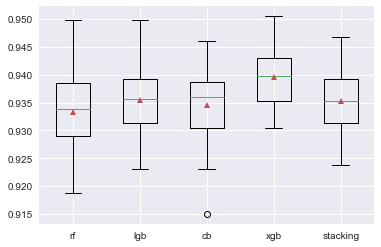

In [46]:
#models

def get_stacking():
    level0 = []
    level0.append(('rf',RandomForestClassifier(random_state=42)))
    level0.append(('lgb',LGBMClassifier(random_state=42)))
    level0.append(('cb',CatBoostClassifier(random_state=42)))
    level0.append(('xgb',XGBClassifier(random_state=42,verbose=0)))
    level1 = XGBClassifier(random_state=42)
    model=StackingClassifier(estimators=level0,final_estimator=level1, cv=5)
    return model

def get_models():
    models= dict()
    models['rf'] = RandomForestClassifier(random_state=42)
    models['lgb'] = LGBMClassifier(random_state=42)
    models['cb'] = CatBoostClassifier(random_state=42,verbose=0)
    models['xgb'] = XGBClassifier(random_state=42,verbose=0)
    models['stacking'] = get_stacking()
    return models


def evaluate_model(model,X,y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3,random_state=42)
    scores = cross_val_score(model, X,y,scoring='accuracy',cv=cv, n_jobs=-1, error_score='raise')
    return scores

models = get_models()

results=[]
names=[]

for name, model in models.items():
    scores = evaluate_model(model, X_res,y_res)
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
    
pyplot.boxplot(results, labels=names,showmeans=True)
pyplot.show()